# Latent forecasting on Lorenz-63: is the tradeoff dissolvable?

The autoencoder experiment (`NeuralNetworkApproximation.ipynb`) showed the bounded/unbounded
chain reconstructing at the noise floor. It did no forecasting at all. This notebook adds the
forecasting arm and asks the question the architecture exists to answer.

**The claim under test.** Reconstruction fidelity and long-horizon forecast quality are widely
treated as competing objectives to be *balanced* — by weighted losses (Coupled Attention
Networks, MemAAE, CAAE), by spectral truncation (SSP, 2026), by shared encoders. The claim here
is that this tension is a suboptimal operating point rather than a law, and that separating the
two latents *dissolves* it.

**Three models, identical footing.**

| | Model | What it says about the tradeoff |
|---|---|---|
| **A** | Ours: bounded/unbounded chain, two forecasters | dissolve it — separate carriers, separate stages |
| **B** | Weighted-loss AE+GRU, phi swept 0 to 1 | balance it — one latent, one knob |
| **C** | Physics-informed latent AE (PINN) | sidestep it — let the equations supply the dynamics |

Model B is the important one. Sweeping phi traces the empirical Pareto front, which is what turns
A and C from isolated numbers into points measured against a curve. A model sitting *above* that
curve is reconstructing and forecasting better than any setting of the knob achieves.

**Matched budget.** Every model gets the same trainable parameter count and the same wall-clock
training seconds, on one pinned CPU thread. Either constraint alone is easy to game.

**What would falsify the claim.** If A lands on the phi curve rather than above it, the tradeoff
is real and the architecture is just another point on it. That is a complete result, and the
notebook is built to report it as clearly as the other outcome.

# Imports

In [1]:
import sys
import time
from pathlib import Path

# Notebook lives in Experimentation/, so add the repo root to sys.path
ROOT = Path.cwd().parent if Path.cwd().name == "Experimentation" else Path.cwd()
if str(ROOT) not in sys.path:
    sys.path.insert(0, str(ROOT))

import numpy as np
import pandas as pd
import torch
import torch.nn as nn
import matplotlib.pyplot as plt
from torch.utils.data import TensorDataset, DataLoader
from tqdm.auto import tqdm
from IPython.display import clear_output

from Src import DecoupledModel
from Comp import JointAEGRU, PhysicsLatentAE
from Utils import (LoadLorenzData, PlotNFeatSeries, PlotLossCurves, PlotParity,
                   PlotChannelBar, PlotAttractor3D, PlotMatrixGrid,
                   PlotHorizonCurves, PlotParetoFront, PlotTimeToQuality)
from Utils.Metrics import (R2, PerChannelR2, NRMSE, PerHorizonNRMSE, VPT,
                           BoundViolation, Saturation, AttractorStats, ZMaxMap,
                           FitProbe, ApplyProbe, StepsPerLyapunov, LAMBDA_MAX,
                           Mse as MseNp)
from Utils.Rollout import (EvaluateModel, ReconMetrics, ForecastMetrics,
                           PersistenceRollout, MeanRollout, EvalWindowsFromTrajectories)
from Utils.Benchmark import (CountParams, CountInferenceParams, CountFlops, MatchWidth,
                             TimedTrain, TimeToTarget, TimeRollout, PinThreads, SeedAll)

# VARS

In [2]:
DATAPATH = ROOT / "Data" / "LorenzLift.npz"
EVALPATH = ROOT / "Data" / "LorenzEval.npz"

# LorenzEval.npz holds independent held-out trajectories. Regenerate both with
#     python SyntheticGenerators/LorenzLift.py      (from the repo root)
assert DATAPATH.exists(), f"missing {DATAPATH}"
assert EVALPATH.exists(), f"missing {EVALPATH} -- run SyntheticGenerators/LorenzLift.py"
print(DATAPATH.name, "and", EVALPATH.name, "found")

LorenzLift.npz and LorenzEval.npz found


# Data Exp

In [3]:
train, val, test, clean, states = LoadLorenzData(DATAPATH)

# clean/states are the full 20000-step series; the splits are 14000/3000/3000.
StatesTrain = states[:len(train)]
StatesVal = states[len(train):len(train) + len(val)]
StatesTest = states[len(train) + len(val):]

Ev = np.load(EVALPATH)
EvalObs, EvalStates = Ev["obs"], Ev["states"]

print(f"train {train.shape}  val {val.shape}  test {test.shape}")
print(f"clean {clean.shape}  states {states.shape}")
print(f"eval trajectories {EvalObs.shape}  states {EvalStates.shape}")
print(f"train mean {train.mean():+.4f} std {train.std():.4f}   "
      f"eval mean {EvalObs.mean():+.4f} std {EvalObs.std():.4f}")

train (14000, 30)  val (3000, 30)  test (3000, 30)
clean (20000, 30)  states (20000, 3)
eval trajectories (32, 12000, 30)  states (32, 12000, 3)
train mean +0.0000 std 1.0000   eval mean -0.0298 std 1.0202


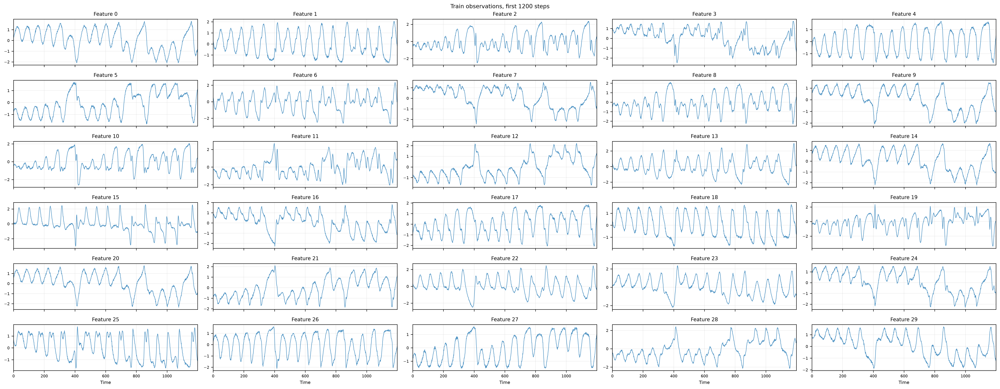

In [4]:
# The observations the models actually see: 30 channels of lifted, noisy Lorenz.
Fig, Axes = PlotNFeatSeries(train[:1200][None], Cols=5)
Fig.suptitle("Train observations, first 1200 steps", fontsize=10, y=1.005)
plt.show()

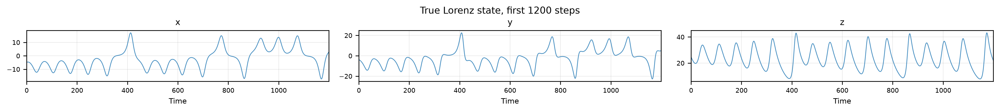

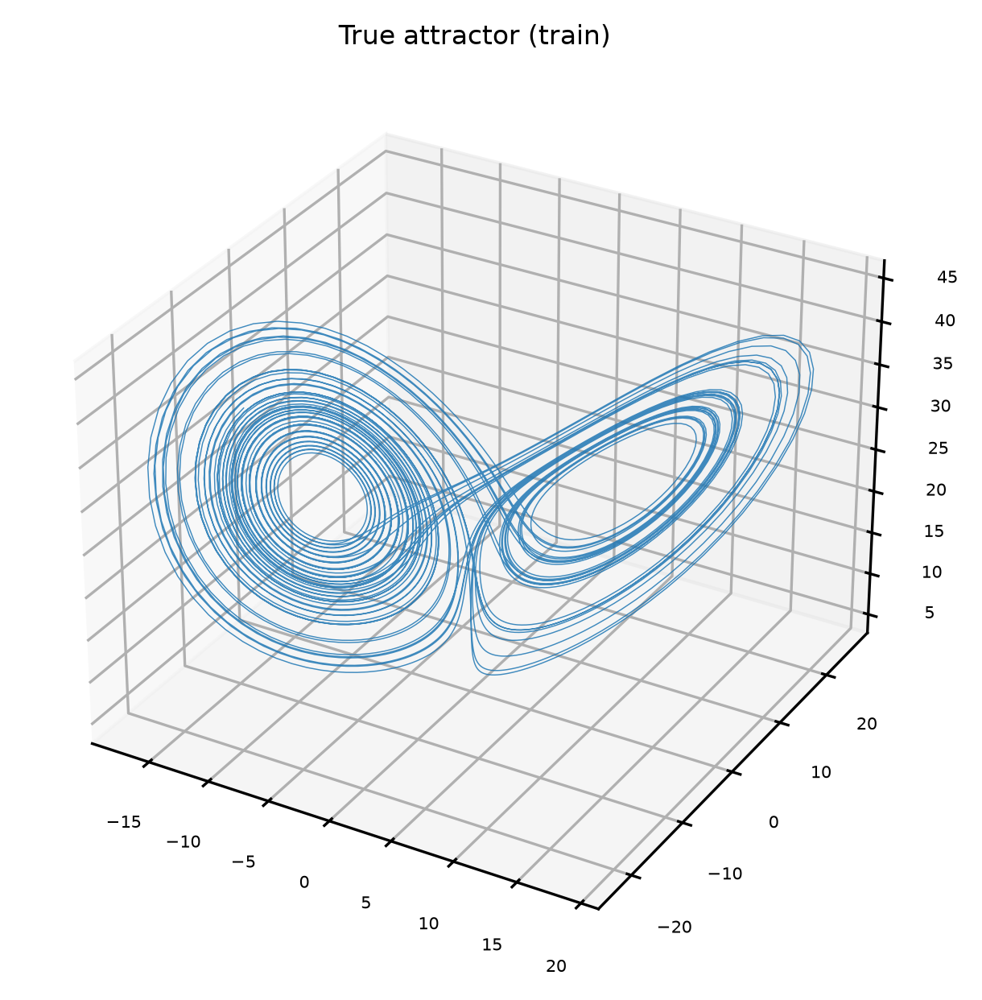

In [5]:
# The 3-d truth underneath. Never in a loss -- diagnostics only.
Fig, Axes = PlotNFeatSeries(StatesTrain[:1200][None], Cols=3, Titles=["x", "y", "z"])
Fig.suptitle("True Lorenz state, first 1200 steps", fontsize=10, y=1.02)
plt.show()

Fig, Axes = PlotAttractor3D([StatesTrain[:6000]], ["True attractor (train)"],
                            Width=4.2, Height=4.2)
plt.show()

observation channels: 30,  global range [-3.44, 3.04]


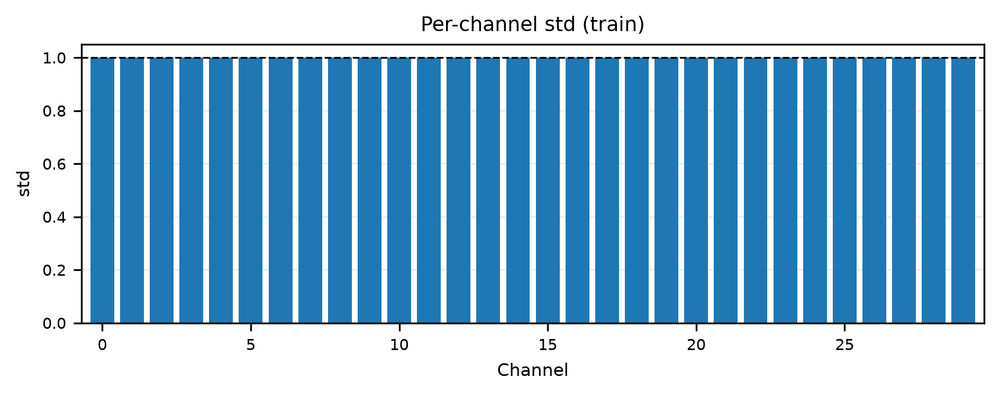

,0,1,2,3,4,5,6,7,8,9,...,20,21,22,23,24,25,26,27,28,29
min,-2.256,-1.750,-2.782,-2.692,-1.826,-1.811,-2.784,-2.441,-2.374,-2.199,...,-2.375,-1.901,-2.816,-2.497,-2.327,-1.800,-2.184,-1.628,-2.202,-1.97
max,1.855,2.137,2.410,1.835,1.741,1.749,2.357,1.518,2.279,1.540,...,1.786,2.256,2.568,2.985,1.635,1.918,1.698,1.724,2.506,1.74
std,1.000,1.000,1.000,1.000,1.000,1.000,1.000,1.000,1.000,1.000,...,1.000,1.000,1.000,1.000,1.000,1.000,1.000,1.000,1.000,1.00


In [6]:
Ranges = pd.DataFrame({"min": train.min(0), "max": train.max(0),
                       "std": train.std(0)}).round(3)
print(f"observation channels: {len(Ranges)},  global range "
      f"[{train.min():.2f}, {train.max():.2f}]")
Fig, Ax = PlotChannelBar(train.std(0), Title="Per-channel std (train)", YLabel="std",
                         Baseline=1.0)
plt.show()
Ranges.T

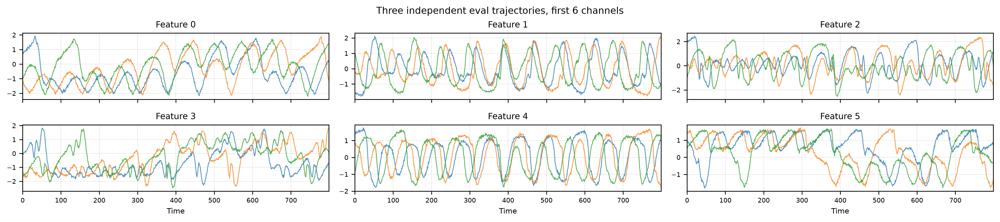

In [7]:
# Sample of the independent evaluation trajectories -- these are what the long
# rollouts are scored against.
Fig, Axes = PlotNFeatSeries(EvalObs[:3, :800, :6], Cols=3)
Fig.suptitle("Three independent eval trajectories, first 6 channels", fontsize=10, y=1.02)
plt.show()

Why a separate evaluation set. The test split is 3000 steps, about **27 Lyapunov times**. Long
rollouts cut from it overlap heavily and share most of their future, so the spread across
"different" starts badly understates the real variance. `LorenzEval.npz` holds 32 independent
trajectories, generated from different initial conditions and pushed through the *frozen* lift —
same `W1`, `W2`, same standardisation constants — so they land in exactly the same observation
space as `train`. The generator asserts this by replaying the lift and matching the stored arrays
to 1e-13.

Known caveat, recorded and not fixed: `lift()` standardises using full-series statistics before
the train-only split, a mild leak baked into the generator upstream of the otherwise-correct
train-only scaling. Left alone so these numbers stay comparable with the existing notebook, but
it should be disclosed if they go in a paper.

# Config

In [8]:
N = train.shape[-1]     # observation dim, 30
K = 3                   # unbounded forecast latent, = known intrinsic dim of Lorenz-63
A, B = 8, 8             # bounded latent C_t is A x B in [0, 1]

DT = 0.01
STEPS_PER_LYAP = StepsPerLyapunov(DT)      # ~110
WARM = 64               # lookback, matches the generator's windows(lookback=64)
UNROLL = 20             # training rollout depth
HORIZON = 550           # ~5 Lyapunov times -- the main forecast curve
CLIMATE = 5500          # ~50 Lyapunov times -- attractor statistics
THRESHOLD = 0.4         # NRMSE level at which VPT is read off

QUICK = False           # True -> tiny budget, for a smoke test
BUDGET_S = 20.0 if QUICK else 120.0    # wall-clock training seconds per model
STAGE_A_FRAC = 0.6      # how ours splits its budget between autoencoder and forecasters
SEEDS = [0] if QUICK else [0, 1, 2]
PHIS = [0.0, 0.25, 0.75, 1.0] if QUICK else [0.0, 0.1, 0.25, 0.5, 0.75, 0.9, 1.0]

BATCH = 256             # per-timestep training (Stage A, PINN)
SEQ_BATCH = 64          # sequence training (Stage B, joint) -- smaller so the
                        # sequence models still get a comparable number of updates
SEQ_STRIDE = 4
LR = 1e-3
W_CONSIST = 1.0
LAM_PHYS = 1.0
PLOT_EVERY = 10
NOISE_FLOOR = 0.05 ** 2

DEVICE = "cuda" if torch.cuda.is_available() else "cpu"
THREADS = PinThreads(1)   # fix the thread count or wall-clock numbers mean nothing

print(f"device {DEVICE}, torch threads {THREADS}")
print(f"budget {BUDGET_S:.0f}s/model, seeds {SEEDS}, phi {PHIS}")
print(f"{STEPS_PER_LYAP:.1f} steps per Lyapunov time -> "
      f"horizon {HORIZON} = {HORIZON / STEPS_PER_LYAP:.1f} LT, "
      f"climate {CLIMATE} = {CLIMATE / STEPS_PER_LYAP:.0f} LT")

device cpu, torch threads 1
budget 120s/model, seeds [0, 1, 2], phi [0.0, 0.1, 0.25, 0.5, 0.75, 0.9, 1.0]
110.4 steps per Lyapunov time -> horizon 550 = 5.0 LT, climate 5500 = 50 LT


The orphaned `windows(horizon=50)` default in the generator is only ~0.45 Lyapunov times — far
too short to expose the failure modes at issue here. Everything below runs to 5 Lyapunov times
for the error curve and 50 for the climate statistics.

## Data

In [9]:
XTrain = torch.tensor(train, dtype=torch.float32, device=DEVICE)
XVal = torch.tensor(val, dtype=torch.float32, device=DEVICE)
XTest = torch.tensor(test, dtype=torch.float32, device=DEVICE)

Loader = DataLoader(TensorDataset(XTrain), batch_size=BATCH, shuffle=True, drop_last=True)

# One climatological scale for everyone, so the 0.4 VPT threshold means the
# same thing across models.
SCALE = float(EvalObs.std())
BOUNDS = (float(train.min()), float(train.max()))

# Held-out rollout windows, from independent trajectories.
WarmNp, FutNp = EvalWindowsFromTrajectories(EvalObs, WARM, HORIZON, per_traj=2, seed=7)
Warm = torch.tensor(WarmNp, dtype=torch.float32, device=DEVICE)
Fut = torch.tensor(FutNp, dtype=torch.float32, device=DEVICE)

WarmCNp, FutCNp = EvalWindowsFromTrajectories(EvalObs, WARM, CLIMATE, per_traj=1, seed=11)
WarmC = torch.tensor(WarmCNp, dtype=torch.float32, device=DEVICE)
FutC = torch.tensor(FutCNp, dtype=torch.float32, device=DEVICE)

print(f"forecast windows {tuple(Warm.shape)} -> {tuple(Fut.shape)}")
print(f"climate windows  {tuple(WarmC.shape)} -> {tuple(FutC.shape)}")
print(f"scale {SCALE:.4f}   bounds {BOUNDS[0]:.2f} .. {BOUNDS[1]:.2f}")

forecast windows (64, 64, 30) -> (64, 550, 30)
climate windows  (32, 64, 30) -> (32, 5500, 30)
scale 1.0202   bounds -3.44 .. 3.04


In [10]:
# Training windows. Stage B only needs the warm-up latents, the starting bounded
# latent and the future observations -- storing whole C windows would cost ~75 MB
# for nothing. The joint model does need the full sequence, since it reconstructs
# every timestep of it.
STARTS = np.arange(0, len(train) - (WARM + UNROLL) + 1, SEQ_STRIDE)
XFull = torch.stack([XTrain[i:i + WARM + UNROLL] for i in STARTS])
XFut = XFull[:, WARM:]

# Same windows on val, for the in-training forecast score.
VSTARTS = np.arange(0, len(val) - (WARM + UNROLL) + 1, 64)[:64]
XValFull = torch.stack([XVal[i:i + WARM + UNROLL] for i in VSTARTS])
XValWarm, XValFut = XValFull[:, :WARM], XValFull[:, WARM:]

print(f"{len(STARTS)} training windows of {WARM}+{UNROLL}, {len(VSTARTS)} val windows")
print(f"XFull {tuple(XFull.shape)}  ({XFull.numel() * 4 / 1e6:.0f} MB)")

3480 training windows of 64+20, 46 val windows
XFull (3480, 84, 30)  (35 MB)


## Matched parameter budget

Ours sets the budget; the baselines are fitted to it by bisecting their hidden width. Exact
matching is impossible — parameter counts jump in steps of a few hundred — so the target is
within a couple of percent and the actual counts are printed rather than rounded away.

Two counts are reported. `LatentBounded` is a **training-only teacher**: it supplies the target
for `m(b_t)` and never runs at inference. Counting it inside a training budget is right;
counting it in a speed table would understate the model.

In [11]:
SeedAll(0)
Reference = DecoupledModel(N, K, A, B)
TARGET = CountParams(Reference)

WidthJoint = MatchWidth(lambda w: JointAEGRU(N, latent=16, width=w), TARGET)
WidthPinn = MatchWidth(lambda w: PhysicsLatentAE(N, width=w), TARGET)

Budget = pd.DataFrame([
    {"model": "Ours (A)", "width": "-", "trainable": TARGET,
     "inference": CountInferenceParams(Reference), "flops": CountFlops(Reference)},
    {"model": "Joint AE+GRU (B)", "width": WidthJoint,
     "trainable": CountParams(JointAEGRU(N, latent=16, width=WidthJoint)),
     "inference": CountInferenceParams(JointAEGRU(N, latent=16, width=WidthJoint)),
     "flops": CountFlops(JointAEGRU(N, latent=16, width=WidthJoint))},
    {"model": "Physics latent AE (C)", "width": WidthPinn,
     "trainable": CountParams(PhysicsLatentAE(N, width=WidthPinn)),
     "inference": CountInferenceParams(PhysicsLatentAE(N, width=WidthPinn)),
     "flops": CountFlops(PhysicsLatentAE(N, width=WidthPinn))},
])
Budget["err %"] = (100 * (Budget["trainable"] - TARGET) / TARGET).round(2)

print(f"Stage A {sum(CountParams(m) for m in Reference.StageAModules()):,}  "
      f"Stage B {sum(CountParams(m) for m in Reference.StageBModules()):,}")
Budget

Stage A 111,039  Stage B 34,371


,model,width,trainable,inference,flops,err %
0,Ours (A),-,145410,116674,286848,0.00
1,Joint AE+GRU (B),231,145728,145728,288716,0.22
2,Physics latent AE (C),253,145767,145767,289432,0.25


## Loss

Each epoch function takes the wall-clock `deadline` and checks it inside its own batch loop.
Without that check the budget could only be enforced at epoch granularity, which quietly favours
whichever model happens to have cheap epochs.

In [12]:
MseT = nn.MSELoss()


def StageAEpoch(Model, Opt, Deadline):
    """Per-timestep autoencoder, identical to the objective in the existing notebook.

    CTeach is deliberately not detached and R stays in the optimiser, matching
    NeuralNetworkApproximation.ipynb so the two runs are comparable. It does mean
    the consistency term pulls teacher toward student as much as the reverse.
    """
    Sums = [0.0, 0.0, 0.0]
    Nb = 0
    Batches = tqdm(Loader, desc="stage A", leave=False)
    for (x,) in Batches:
        if time.perf_counter() > Deadline:
            Batches.close()
            break
        XHat, Ct, CTeach, _, _ = Model(x)
        Recon, Consist = MseT(XHat, x), MseT(Ct, CTeach)
        Total = Recon + W_CONSIST * Consist
        Opt.zero_grad(); Total.backward(); Opt.step()
        Vals = [Total.item(), Recon.item(), Consist.item()]
        Sums = [s + v for s, v in zip(Sums, Vals)]
        Nb += 1
        Batches.set_postfix(recon=f"{Vals[1]:.2e}", consist=f"{Vals[2]:.2e}")
    Nb = max(Nb, 1)
    return {"total": Sums[0] / Nb, "recon": Sums[1] / Nb, "consistency": Sums[2] / Nb}


def StageBEpoch(Model, Opt, Bwarm, Cstart, Deadline):
    """Both forecasters, on latents from the frozen Stage-A autoencoder.

    The loss is in observation space -- decoded through the frozen decoder -- so it
    is the same objective the joint baseline optimises, and the comparison is not
    about which loss each model happens to like.
    """
    Perm = torch.randperm(Bwarm.shape[0])
    Sum, Nb = 0.0, 0
    Batches = tqdm(range(0, len(Perm), SEQ_BATCH), desc="stage B", leave=False)
    for i in Batches:
        if time.perf_counter() > Deadline:
            Batches.close()
            break
        j = Perm[i:i + SEQ_BATCH]
        b0, Cp, Xf = Bwarm[j], Cstart[j], XFut[j]
        _, St = Model.G(b0[:, :-1], None)
        Bc, Out = b0[:, -1], []
        for _ in range(UNROLL):
            Bc, St = Model.G.Step(Bc, St)
            Cp = Model.MD(Bc, Cp)
            Out.append(Model.D(Cp))
        Loss = MseT(torch.stack(Out, 1), Xf)
        Opt.zero_grad(); Loss.backward(); Opt.step()
        Sum += Loss.item(); Nb += 1
        Batches.set_postfix(fcst=f"{Loss.item():.2e}")
    return {"fcst": Sum / max(Nb, 1)}


def JointEpoch(Model, Opt, Deadline, Phi):
    Perm = torch.randperm(XFull.shape[0])
    Sums, Nb = [0.0, 0.0], 0
    Batches = tqdm(range(0, len(Perm), SEQ_BATCH), desc=f"phi {Phi:g}", leave=False)
    for i in Batches:
        if time.perf_counter() > Deadline:
            Batches.close()
            break
        Rec, Fc = Model.Losses(XFull[Perm[i:i + SEQ_BATCH]], WARM)
        Loss = (1.0 - Phi) * Rec + Phi * Fc
        Opt.zero_grad(); Loss.backward(); Opt.step()
        Sums = [Sums[0] + Rec.item(), Sums[1] + Fc.item()]
        Nb += 1
        Batches.set_postfix(recon=f"{Rec.item():.2e}", fcst=f"{Fc.item():.2e}")
    Nb = max(Nb, 1)
    return {"recon": Sums[0] / Nb, "fcst": Sums[1] / Nb}


def PinnEpoch(Model, Opt, T3, Deadline):
    Perm = torch.randperm(T3.shape[0])
    Sums, Nb = [0.0, 0.0], 0
    Batches = tqdm(range(0, len(Perm), BATCH), desc="pinn", leave=False)
    for i in Batches:
        if time.perf_counter() > Deadline:
            Batches.close()
            break
        Rec, Phys = Model.Losses(T3[Perm[i:i + BATCH]])
        Loss = Rec + LAM_PHYS * Phys
        Opt.zero_grad(); Loss.backward(); Opt.step()
        Sums = [Sums[0] + Rec.item(), Sums[1] + Phys.item()]
        Nb += 1
        Batches.set_postfix(recon=f"{Rec.item():.2e}", phys=f"{Phys.item():.2e}")
    Nb = max(Nb, 1)
    return {"recon": Sums[0] / Nb, "physics": Sums[1] / Nb}

In [13]:
@torch.no_grad()
def ValScores(Model, Fcst=True, **Kw):
    """Cheap in-training validation. TimedTrain refunds the time this takes."""
    Was = Model.training
    Model.eval()
    Out = {"val_recon": MseT(Model.Reconstruct(XValFull), XValFull).item()}
    if Fcst:
        Out["val_fcst"] = MseT(Model.Rollout(XValWarm, UNROLL, **Kw), XValFut).item()
    if Was:
        Model.train()
    return Out


def LossPlot(Keys, Floor=None, Title=None):
    """Live loss curve for TimedTrain, in the style of the autoencoder notebook."""
    def Fn(Hist):
        Fig, Ax = PlotLossCurves({k: Hist[k] for k in Keys if k in Hist})
        if Floor is not None:
            Ax.axhline(Floor, color="k", linestyle="--", linewidth=0.8)
        if Title is not None:
            Ax.set_title(Title, fontsize=9)
    return Fn

# Model A -- ours, two-stage

Stage A trains the autoencoder exactly as before. Stage B then **freezes** `E, f, m, D` and fits
the two forecasters on the frozen latents:

```
b_{t+1} = g(b_t)                 GRU on the unbounded latent
C_{t+1} = m_dyn(b_{t+1}, C_t)    bounded latent advanced, not recomputed
x_{t+1} = D(C_{t+1})
```

Freezing is what makes the decoupling real here. The topology is a *chain* — reconstruction
gradients flow through `b` — so if both stages trained together the forecast objective would
reshape `b` and therefore reconstruction, which is precisely the coupling the phi baseline
represents. Decoupling in this architecture comes from the training schedule, and the joint
variant in the ablations is run specifically to show what happens without it.

Stage B trains on **precomputed** latents, so its updates are far cheaper than the joint model's,
which re-encodes every batch. That is a genuine computational advantage of two-stage decoupling
rather than an artifact, and the wall-clock budget is what surfaces it.

## Training

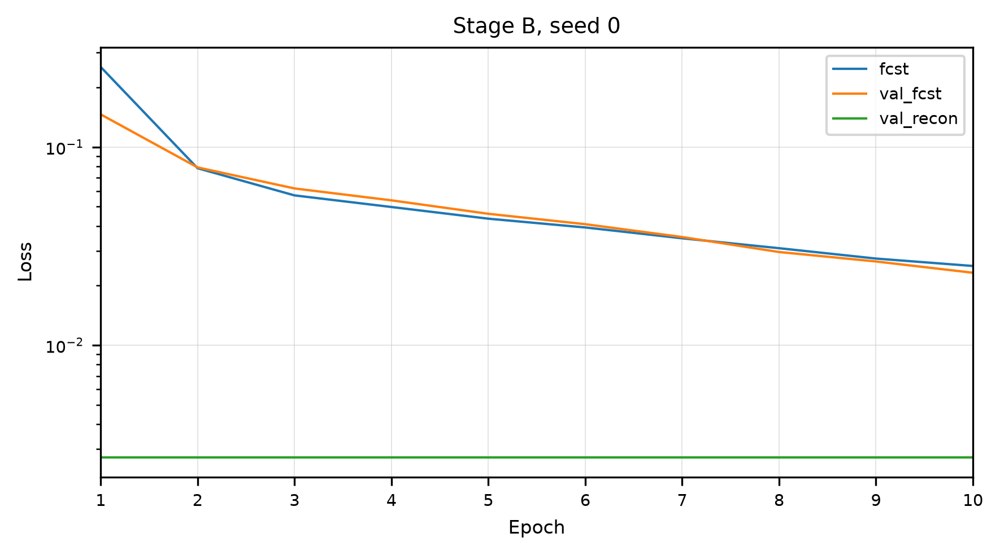

ours B (seed 0) epoch 0010 |   39.4s | fcst 2.513e-02 | val_recon 2.721e-03 | val_fcst 2.323e-02


stage B:   0%|          | 0/55 [00:00<?, ?it/s]

ours B (seed 0) epoch 0011 |   43.5s | fcst 2.281e-02 | val_recon 2.721e-03 | val_fcst 2.415e-02


stage B:   0%|          | 0/55 [00:00<?, ?it/s]

ours B (seed 0) epoch 0012 |   47.5s | fcst 2.267e-02 | val_recon 2.721e-03 | val_fcst 2.309e-02


stage B:   0%|          | 0/55 [00:00<?, ?it/s]

ours B (seed 0) epoch 0013 |   48.1s | fcst 2.434e-02 | val_recon 2.721e-03 | val_fcst 2.147e-02


ours A (seed 1):   0%|          | 0/72 [00:00<?, ?s/s]

stage A:   0%|          | 0/54 [00:00<?, ?it/s]

stage A:   0%|          | 0/54 [00:00<?, ?it/s]

stage A:   0%|          | 0/54 [00:00<?, ?it/s]

stage A:   0%|          | 0/54 [00:00<?, ?it/s]

stage A:   0%|          | 0/54 [00:00<?, ?it/s]

stage A:   0%|          | 0/54 [00:00<?, ?it/s]

stage A:   0%|          | 0/54 [00:00<?, ?it/s]

stage A:   0%|          | 0/54 [00:00<?, ?it/s]

stage A:   0%|          | 0/54 [00:00<?, ?it/s]

stage A:   0%|          | 0/54 [00:00<?, ?it/s]

stage A:   0%|          | 0/54 [00:00<?, ?it/s]

stage A:   0%|          | 0/54 [00:00<?, ?it/s]

stage A:   0%|          | 0/54 [00:00<?, ?it/s]

stage A:   0%|          | 0/54 [00:00<?, ?it/s]

stage A:   0%|          | 0/54 [00:00<?, ?it/s]

stage A:   0%|          | 0/54 [00:00<?, ?it/s]

stage A:   0%|          | 0/54 [00:00<?, ?it/s]

stage A:   0%|          | 0/54 [00:00<?, ?it/s]

stage A:   0%|          | 0/54 [00:00<?, ?it/s]

stage A:   0%|          | 0/54 [00:00<?, ?it/s]

stage A:   0%|          | 0/54 [00:00<?, ?it/s]

stage A:   0%|          | 0/54 [00:00<?, ?it/s]

stage A:   0%|          | 0/54 [00:00<?, ?it/s]

stage A:   0%|          | 0/54 [00:00<?, ?it/s]

stage A:   0%|          | 0/54 [00:00<?, ?it/s]

stage A:   0%|          | 0/54 [00:00<?, ?it/s]

stage A:   0%|          | 0/54 [00:00<?, ?it/s]

stage A:   0%|          | 0/54 [00:00<?, ?it/s]

stage A:   0%|          | 0/54 [00:00<?, ?it/s]

stage A:   0%|          | 0/54 [00:00<?, ?it/s]

stage A:   0%|          | 0/54 [00:00<?, ?it/s]

stage A:   0%|          | 0/54 [00:00<?, ?it/s]

stage A:   0%|          | 0/54 [00:00<?, ?it/s]

stage A:   0%|          | 0/54 [00:00<?, ?it/s]

stage A:   0%|          | 0/54 [00:00<?, ?it/s]

stage A:   0%|          | 0/54 [00:00<?, ?it/s]

stage A:   0%|          | 0/54 [00:00<?, ?it/s]

stage A:   0%|          | 0/54 [00:00<?, ?it/s]

stage A:   0%|          | 0/54 [00:00<?, ?it/s]

stage A:   0%|          | 0/54 [00:00<?, ?it/s]

stage A:   0%|          | 0/54 [00:00<?, ?it/s]

stage A:   0%|          | 0/54 [00:00<?, ?it/s]

stage A:   0%|          | 0/54 [00:00<?, ?it/s]

stage A:   0%|          | 0/54 [00:00<?, ?it/s]

stage A:   0%|          | 0/54 [00:00<?, ?it/s]

stage A:   0%|          | 0/54 [00:00<?, ?it/s]

stage A:   0%|          | 0/54 [00:00<?, ?it/s]

stage A:   0%|          | 0/54 [00:00<?, ?it/s]

stage A:   0%|          | 0/54 [00:00<?, ?it/s]

stage A:   0%|          | 0/54 [00:00<?, ?it/s]

stage A:   0%|          | 0/54 [00:00<?, ?it/s]

stage A:   0%|          | 0/54 [00:00<?, ?it/s]

stage A:   0%|          | 0/54 [00:00<?, ?it/s]

stage A:   0%|          | 0/54 [00:00<?, ?it/s]

stage A:   0%|          | 0/54 [00:00<?, ?it/s]

stage A:   0%|          | 0/54 [00:00<?, ?it/s]

stage A:   0%|          | 0/54 [00:00<?, ?it/s]

stage A:   0%|          | 0/54 [00:00<?, ?it/s]

stage A:   0%|          | 0/54 [00:00<?, ?it/s]

stage A:   0%|          | 0/54 [00:00<?, ?it/s]

stage A:   0%|          | 0/54 [00:00<?, ?it/s]

stage A:   0%|          | 0/54 [00:00<?, ?it/s]

stage A:   0%|          | 0/54 [00:00<?, ?it/s]

stage A:   0%|          | 0/54 [00:00<?, ?it/s]

stage A:   0%|          | 0/54 [00:00<?, ?it/s]

stage A:   0%|          | 0/54 [00:00<?, ?it/s]

stage A:   0%|          | 0/54 [00:00<?, ?it/s]

stage A:   0%|          | 0/54 [00:00<?, ?it/s]

stage A:   0%|          | 0/54 [00:00<?, ?it/s]

stage A:   0%|          | 0/54 [00:00<?, ?it/s]

stage A:   0%|          | 0/54 [00:00<?, ?it/s]

stage A:   0%|          | 0/54 [00:00<?, ?it/s]

stage A:   0%|          | 0/54 [00:00<?, ?it/s]

stage A:   0%|          | 0/54 [00:00<?, ?it/s]

stage A:   0%|          | 0/54 [00:00<?, ?it/s]

stage A:   0%|          | 0/54 [00:00<?, ?it/s]

stage A:   0%|          | 0/54 [00:00<?, ?it/s]

stage A:   0%|          | 0/54 [00:00<?, ?it/s]

stage A:   0%|          | 0/54 [00:00<?, ?it/s]

stage A:   0%|          | 0/54 [00:00<?, ?it/s]

stage A:   0%|          | 0/54 [00:00<?, ?it/s]

stage A:   0%|          | 0/54 [00:00<?, ?it/s]

stage A:   0%|          | 0/54 [00:00<?, ?it/s]

stage A:   0%|          | 0/54 [00:00<?, ?it/s]

stage A:   0%|          | 0/54 [00:00<?, ?it/s]

stage A:   0%|          | 0/54 [00:00<?, ?it/s]

stage A:   0%|          | 0/54 [00:00<?, ?it/s]

stage A:   0%|          | 0/54 [00:00<?, ?it/s]

stage A:   0%|          | 0/54 [00:00<?, ?it/s]

stage A:   0%|          | 0/54 [00:00<?, ?it/s]

stage A:   0%|          | 0/54 [00:00<?, ?it/s]

stage A:   0%|          | 0/54 [00:00<?, ?it/s]

stage A:   0%|          | 0/54 [00:00<?, ?it/s]

stage A:   0%|          | 0/54 [00:00<?, ?it/s]

stage A:   0%|          | 0/54 [00:00<?, ?it/s]

stage A:   0%|          | 0/54 [00:00<?, ?it/s]

stage A:   0%|          | 0/54 [00:00<?, ?it/s]

stage A:   0%|          | 0/54 [00:00<?, ?it/s]

stage A:   0%|          | 0/54 [00:00<?, ?it/s]

stage A:   0%|          | 0/54 [00:00<?, ?it/s]

stage A:   0%|          | 0/54 [00:00<?, ?it/s]

stage A:   0%|          | 0/54 [00:00<?, ?it/s]

stage A:   0%|          | 0/54 [00:00<?, ?it/s]

stage A:   0%|          | 0/54 [00:00<?, ?it/s]

stage A:   0%|          | 0/54 [00:00<?, ?it/s]

stage A:   0%|          | 0/54 [00:00<?, ?it/s]

stage A:   0%|          | 0/54 [00:00<?, ?it/s]

stage A:   0%|          | 0/54 [00:00<?, ?it/s]

stage A:   0%|          | 0/54 [00:00<?, ?it/s]

stage A:   0%|          | 0/54 [00:00<?, ?it/s]

stage A:   0%|          | 0/54 [00:00<?, ?it/s]

stage A:   0%|          | 0/54 [00:00<?, ?it/s]

stage A:   0%|          | 0/54 [00:00<?, ?it/s]

stage A:   0%|          | 0/54 [00:00<?, ?it/s]

stage A:   0%|          | 0/54 [00:00<?, ?it/s]

stage A:   0%|          | 0/54 [00:00<?, ?it/s]

stage A:   0%|          | 0/54 [00:00<?, ?it/s]

stage A:   0%|          | 0/54 [00:00<?, ?it/s]

stage A:   0%|          | 0/54 [00:00<?, ?it/s]

ours B (seed 1):   0%|          | 0/48 [00:00<?, ?s/s]

stage B:   0%|          | 0/55 [00:00<?, ?it/s]

stage B:   0%|          | 0/55 [00:00<?, ?it/s]

stage B:   0%|          | 0/55 [00:00<?, ?it/s]

stage B:   0%|          | 0/55 [00:00<?, ?it/s]

stage B:   0%|          | 0/55 [00:00<?, ?it/s]

stage B:   0%|          | 0/55 [00:00<?, ?it/s]

stage B:   0%|          | 0/55 [00:00<?, ?it/s]

stage B:   0%|          | 0/55 [00:00<?, ?it/s]

stage B:   0%|          | 0/55 [00:00<?, ?it/s]

stage B:   0%|          | 0/55 [00:00<?, ?it/s]

stage B:   0%|          | 0/55 [00:00<?, ?it/s]

stage B:   0%|          | 0/55 [00:00<?, ?it/s]

stage B:   0%|          | 0/55 [00:00<?, ?it/s]

ours A (seed 2):   0%|          | 0/72 [00:00<?, ?s/s]

stage A:   0%|          | 0/54 [00:00<?, ?it/s]

stage A:   0%|          | 0/54 [00:00<?, ?it/s]

stage A:   0%|          | 0/54 [00:00<?, ?it/s]

stage A:   0%|          | 0/54 [00:00<?, ?it/s]

stage A:   0%|          | 0/54 [00:00<?, ?it/s]

stage A:   0%|          | 0/54 [00:00<?, ?it/s]

stage A:   0%|          | 0/54 [00:00<?, ?it/s]

stage A:   0%|          | 0/54 [00:00<?, ?it/s]

stage A:   0%|          | 0/54 [00:00<?, ?it/s]

stage A:   0%|          | 0/54 [00:00<?, ?it/s]

stage A:   0%|          | 0/54 [00:00<?, ?it/s]

stage A:   0%|          | 0/54 [00:00<?, ?it/s]

stage A:   0%|          | 0/54 [00:00<?, ?it/s]

stage A:   0%|          | 0/54 [00:00<?, ?it/s]

stage A:   0%|          | 0/54 [00:00<?, ?it/s]

stage A:   0%|          | 0/54 [00:00<?, ?it/s]

stage A:   0%|          | 0/54 [00:00<?, ?it/s]

stage A:   0%|          | 0/54 [00:00<?, ?it/s]

stage A:   0%|          | 0/54 [00:00<?, ?it/s]

stage A:   0%|          | 0/54 [00:00<?, ?it/s]

stage A:   0%|          | 0/54 [00:00<?, ?it/s]

stage A:   0%|          | 0/54 [00:00<?, ?it/s]

stage A:   0%|          | 0/54 [00:00<?, ?it/s]

stage A:   0%|          | 0/54 [00:00<?, ?it/s]

stage A:   0%|          | 0/54 [00:00<?, ?it/s]

stage A:   0%|          | 0/54 [00:00<?, ?it/s]

stage A:   0%|          | 0/54 [00:00<?, ?it/s]

stage A:   0%|          | 0/54 [00:00<?, ?it/s]

stage A:   0%|          | 0/54 [00:00<?, ?it/s]

stage A:   0%|          | 0/54 [00:00<?, ?it/s]

stage A:   0%|          | 0/54 [00:00<?, ?it/s]

stage A:   0%|          | 0/54 [00:00<?, ?it/s]

stage A:   0%|          | 0/54 [00:00<?, ?it/s]

stage A:   0%|          | 0/54 [00:00<?, ?it/s]

stage A:   0%|          | 0/54 [00:00<?, ?it/s]

stage A:   0%|          | 0/54 [00:00<?, ?it/s]

stage A:   0%|          | 0/54 [00:00<?, ?it/s]

stage A:   0%|          | 0/54 [00:00<?, ?it/s]

stage A:   0%|          | 0/54 [00:00<?, ?it/s]

stage A:   0%|          | 0/54 [00:00<?, ?it/s]

stage A:   0%|          | 0/54 [00:00<?, ?it/s]

stage A:   0%|          | 0/54 [00:00<?, ?it/s]

stage A:   0%|          | 0/54 [00:00<?, ?it/s]

stage A:   0%|          | 0/54 [00:00<?, ?it/s]

stage A:   0%|          | 0/54 [00:00<?, ?it/s]

stage A:   0%|          | 0/54 [00:00<?, ?it/s]

stage A:   0%|          | 0/54 [00:00<?, ?it/s]

stage A:   0%|          | 0/54 [00:00<?, ?it/s]

stage A:   0%|          | 0/54 [00:00<?, ?it/s]

stage A:   0%|          | 0/54 [00:00<?, ?it/s]

stage A:   0%|          | 0/54 [00:00<?, ?it/s]

stage A:   0%|          | 0/54 [00:00<?, ?it/s]

stage A:   0%|          | 0/54 [00:00<?, ?it/s]

stage A:   0%|          | 0/54 [00:00<?, ?it/s]

stage A:   0%|          | 0/54 [00:00<?, ?it/s]

stage A:   0%|          | 0/54 [00:00<?, ?it/s]

stage A:   0%|          | 0/54 [00:00<?, ?it/s]

stage A:   0%|          | 0/54 [00:00<?, ?it/s]

stage A:   0%|          | 0/54 [00:00<?, ?it/s]

stage A:   0%|          | 0/54 [00:00<?, ?it/s]

stage A:   0%|          | 0/54 [00:00<?, ?it/s]

stage A:   0%|          | 0/54 [00:00<?, ?it/s]

stage A:   0%|          | 0/54 [00:00<?, ?it/s]

stage A:   0%|          | 0/54 [00:00<?, ?it/s]

stage A:   0%|          | 0/54 [00:00<?, ?it/s]

stage A:   0%|          | 0/54 [00:00<?, ?it/s]

stage A:   0%|          | 0/54 [00:00<?, ?it/s]

stage A:   0%|          | 0/54 [00:00<?, ?it/s]

stage A:   0%|          | 0/54 [00:00<?, ?it/s]

stage A:   0%|          | 0/54 [00:00<?, ?it/s]

stage A:   0%|          | 0/54 [00:00<?, ?it/s]

stage A:   0%|          | 0/54 [00:00<?, ?it/s]

stage A:   0%|          | 0/54 [00:00<?, ?it/s]

stage A:   0%|          | 0/54 [00:00<?, ?it/s]

stage A:   0%|          | 0/54 [00:00<?, ?it/s]

stage A:   0%|          | 0/54 [00:00<?, ?it/s]

stage A:   0%|          | 0/54 [00:00<?, ?it/s]

stage A:   0%|          | 0/54 [00:00<?, ?it/s]

stage A:   0%|          | 0/54 [00:00<?, ?it/s]

stage A:   0%|          | 0/54 [00:00<?, ?it/s]

stage A:   0%|          | 0/54 [00:00<?, ?it/s]

stage A:   0%|          | 0/54 [00:00<?, ?it/s]

stage A:   0%|          | 0/54 [00:00<?, ?it/s]

stage A:   0%|          | 0/54 [00:00<?, ?it/s]

stage A:   0%|          | 0/54 [00:00<?, ?it/s]

stage A:   0%|          | 0/54 [00:00<?, ?it/s]

stage A:   0%|          | 0/54 [00:00<?, ?it/s]

stage A:   0%|          | 0/54 [00:00<?, ?it/s]

stage A:   0%|          | 0/54 [00:00<?, ?it/s]

stage A:   0%|          | 0/54 [00:00<?, ?it/s]

stage A:   0%|          | 0/54 [00:00<?, ?it/s]

stage A:   0%|          | 0/54 [00:00<?, ?it/s]

stage A:   0%|          | 0/54 [00:00<?, ?it/s]

stage A:   0%|          | 0/54 [00:00<?, ?it/s]

stage A:   0%|          | 0/54 [00:00<?, ?it/s]

stage A:   0%|          | 0/54 [00:00<?, ?it/s]

stage A:   0%|          | 0/54 [00:00<?, ?it/s]

stage A:   0%|          | 0/54 [00:00<?, ?it/s]

stage A:   0%|          | 0/54 [00:00<?, ?it/s]

stage A:   0%|          | 0/54 [00:00<?, ?it/s]

stage A:   0%|          | 0/54 [00:00<?, ?it/s]

stage A:   0%|          | 0/54 [00:00<?, ?it/s]

stage A:   0%|          | 0/54 [00:00<?, ?it/s]

stage A:   0%|          | 0/54 [00:00<?, ?it/s]

stage A:   0%|          | 0/54 [00:00<?, ?it/s]

stage A:   0%|          | 0/54 [00:00<?, ?it/s]

stage A:   0%|          | 0/54 [00:00<?, ?it/s]

stage A:   0%|          | 0/54 [00:00<?, ?it/s]

stage A:   0%|          | 0/54 [00:00<?, ?it/s]

stage A:   0%|          | 0/54 [00:00<?, ?it/s]

stage A:   0%|          | 0/54 [00:00<?, ?it/s]

stage A:   0%|          | 0/54 [00:00<?, ?it/s]

stage A:   0%|          | 0/54 [00:00<?, ?it/s]

stage A:   0%|          | 0/54 [00:00<?, ?it/s]

stage A:   0%|          | 0/54 [00:00<?, ?it/s]

stage A:   0%|          | 0/54 [00:00<?, ?it/s]

stage A:   0%|          | 0/54 [00:00<?, ?it/s]

stage A:   0%|          | 0/54 [00:00<?, ?it/s]

stage A:   0%|          | 0/54 [00:00<?, ?it/s]

ours B (seed 2):   0%|          | 0/48 [00:00<?, ?s/s]

stage B:   0%|          | 0/55 [00:00<?, ?it/s]

stage B:   0%|          | 0/55 [00:00<?, ?it/s]

stage B:   0%|          | 0/55 [00:00<?, ?it/s]

stage B:   0%|          | 0/55 [00:00<?, ?it/s]

stage B:   0%|          | 0/55 [00:00<?, ?it/s]

stage B:   0%|          | 0/55 [00:00<?, ?it/s]

stage B:   0%|          | 0/55 [00:00<?, ?it/s]

stage B:   0%|          | 0/55 [00:00<?, ?it/s]

stage B:   0%|          | 0/55 [00:00<?, ?it/s]

stage B:   0%|          | 0/55 [00:00<?, ?it/s]

stage B:   0%|          | 0/55 [00:00<?, ?it/s]

stage B:   0%|          | 0/55 [00:00<?, ?it/s]

stage B:   0%|          | 0/55 [00:00<?, ?it/s]


stage A 113 epochs, stage B 13 epochs, 120.1s total


In [14]:
def TrainOurs(Seed, Budget=BUDGET_S, Verbose=True):
    SeedAll(Seed)
    Model = DecoupledModel(N, K, A, B).to(DEVICE)

    # -- Stage A: reconstruction only
    OptA = torch.optim.Adam(Model.parameters(), lr=LR)
    HistA = TimedTrain(lambda dl: StageAEpoch(Model, OptA, dl),
                       EvalFn=lambda: ValScores(Model, Fcst=False),
                       budget_s=Budget * STAGE_A_FRAC, name=f"ours A (seed {Seed})",
                       PlotFn=LossPlot(["total", "recon", "consistency", "val_recon"],
                                       Floor=NOISE_FLOOR,
                                       Title=f"Stage A, seed {Seed}") if Verbose else None,
                       plot_every=PLOT_EVERY, verbose=Verbose)

    # -- Freeze, then precompute the latent sequences once
    for m in (Model.E, Model.F, Model.M, Model.D, Model.R):
        for p in m.parameters():
            p.requires_grad_(False)
    with torch.no_grad():
        Hs = Model.E(XTrain)
        Bs = Model.F(Hs)
        Cs = Model.M(Bs)
    Bwarm = torch.stack([Bs[i:i + WARM] for i in STARTS])
    Cstart = torch.stack([Cs[i + WARM - 1] for i in STARTS])

    # -- Stage B: the two forecasters
    OptB = torch.optim.Adam(list(Model.G.parameters()) + list(Model.MD.parameters()), lr=LR)
    HistB = TimedTrain(lambda dl: StageBEpoch(Model, OptB, Bwarm, Cstart, dl),
                       EvalFn=lambda: ValScores(Model),
                       budget_s=Budget * (1 - STAGE_A_FRAC), name=f"ours B (seed {Seed})",
                       PlotFn=LossPlot(["fcst", "val_fcst", "val_recon"],
                                       Title=f"Stage B, seed {Seed}") if Verbose else None,
                       plot_every=max(PLOT_EVERY // 2, 1), verbose=Verbose)

    Hist = {"elapsed": list(HistA["elapsed"])
                       + [HistA["total_time"] + t for t in HistB["elapsed"]],
            "val_recon": HistA["val_recon"] + HistB["val_recon"],
            "total_time": HistA["total_time"] + HistB["total_time"],
            "stageA": HistA, "stageB": HistB}
    return Model, Hist


OursModels, OursHists = [], []
for Seed in SEEDS:
    Model, Hist = TrainOurs(Seed, Verbose=(Seed == SEEDS[0]))
    OursModels.append(Model); OursHists.append(Hist)

print(f"\nstage A {OursHists[0]['stageA']['epochs_done']} epochs, "
      f"stage B {OursHists[0]['stageB']['epochs_done']} epochs, "
      f"{OursHists[0]['total_time']:.1f}s total")

## Final losses

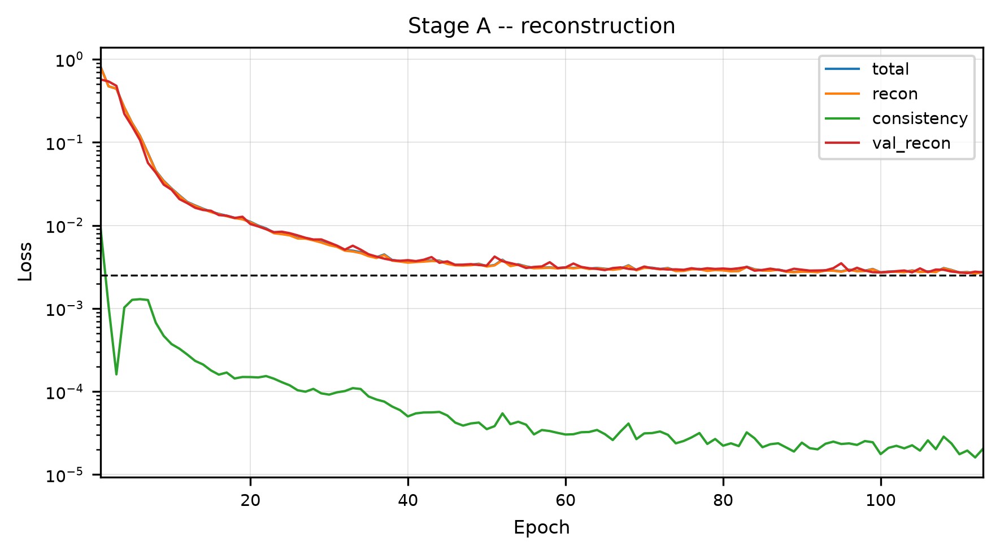

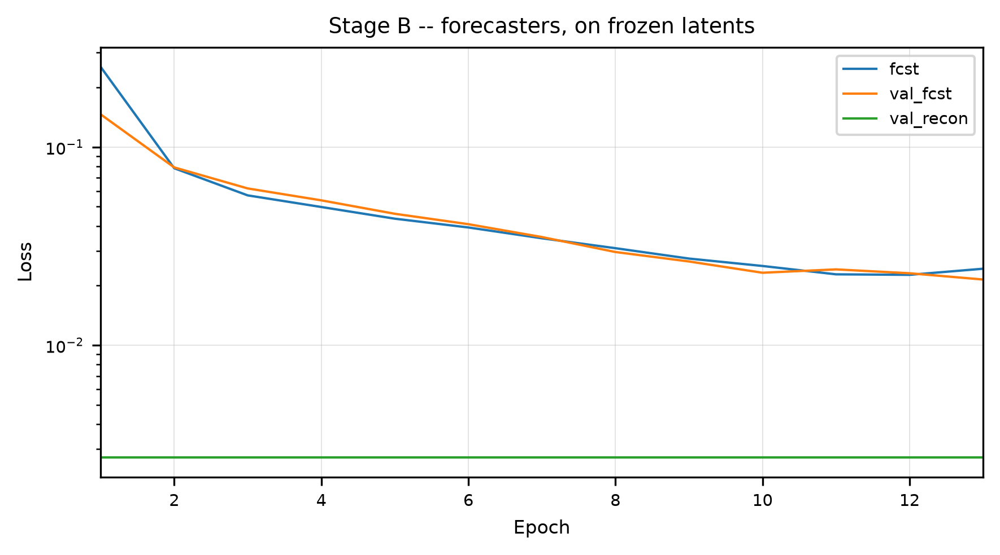

             total: 0.00277
             recon: 0.00275
       consistency: 0.00002
         val_recon: 0.00272
       noise floor: 0.00250
      stage B fcst: 0.02434
  stage B val_fcst: 0.02147
 stage B val_recon: 0.00272


In [15]:
HA, HB = OursHists[0]["stageA"], OursHists[0]["stageB"]
Fig, Ax = PlotLossCurves({k: HA[k] for k in ("total", "recon", "consistency", "val_recon")})
Ax.axhline(NOISE_FLOOR, color="k", linestyle="--", linewidth=0.8)
Ax.set_title("Stage A -- reconstruction", fontsize=9)
plt.show()

Fig, Ax = PlotLossCurves({k: HB[k] for k in ("fcst", "val_fcst", "val_recon")})
Ax.set_title("Stage B -- forecasters, on frozen latents", fontsize=9)
plt.show()

for Name, V in [("total", HA["total"][-1]), ("recon", HA["recon"][-1]),
                ("consistency", HA["consistency"][-1]), ("val_recon", HA["val_recon"][-1]),
                ("noise floor", NOISE_FLOOR), ("stage B fcst", HB["fcst"][-1]),
                ("stage B val_fcst", HB["val_fcst"][-1]),
                ("stage B val_recon", HB["val_recon"][-1])]:
    print(f"{Name:>18}: {V:.5f}")

Sanity gate: Stage A should land near the numbers the autoencoder notebook already reported —
test reconstruction ~0.0026 against a 0.0025 noise floor, R^2 ~0.997. If it does not, something
upstream has broken and nothing downstream is worth reading.

## True vs predicted observations

test recon MSE 0.00270   (reference run: 0.00259, floor 0.00250)
test R2        0.9972   (reference run: 0.9973)


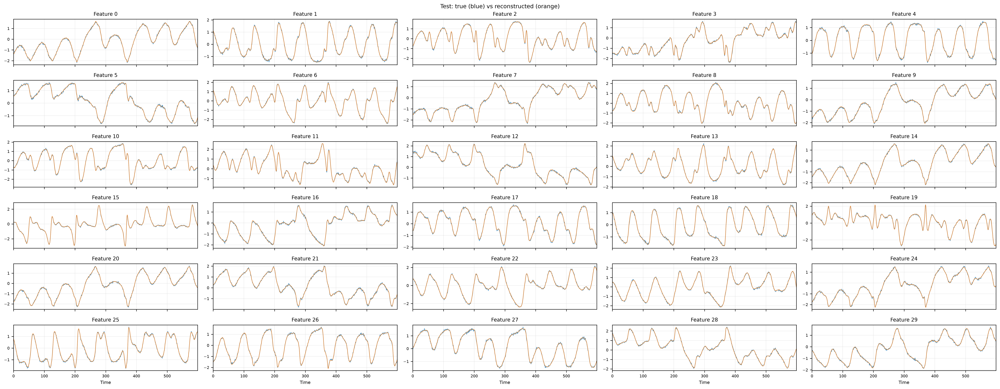

In [16]:
Best = OursModels[0]
with torch.no_grad():
    XHatTest = Best.Reconstruct(XTest.unsqueeze(0)).squeeze(0).cpu().numpy()

print(f"test recon MSE {MseNp(test, XHatTest):.5f}   "
      f"(reference run: 0.00259, floor {NOISE_FLOOR:.5f})")
print(f"test R2        {R2(test, XHatTest):.4f}   (reference run: 0.9973)")

Slice = slice(0, 600)
Pair = np.stack([test[Slice], XHatTest[Slice]])
Fig, Axes = PlotNFeatSeries(Pair, Cols=5)
Fig.suptitle("Test: true (blue) vs reconstructed (orange)", fontsize=10, y=1.005)
plt.show()

### Parity

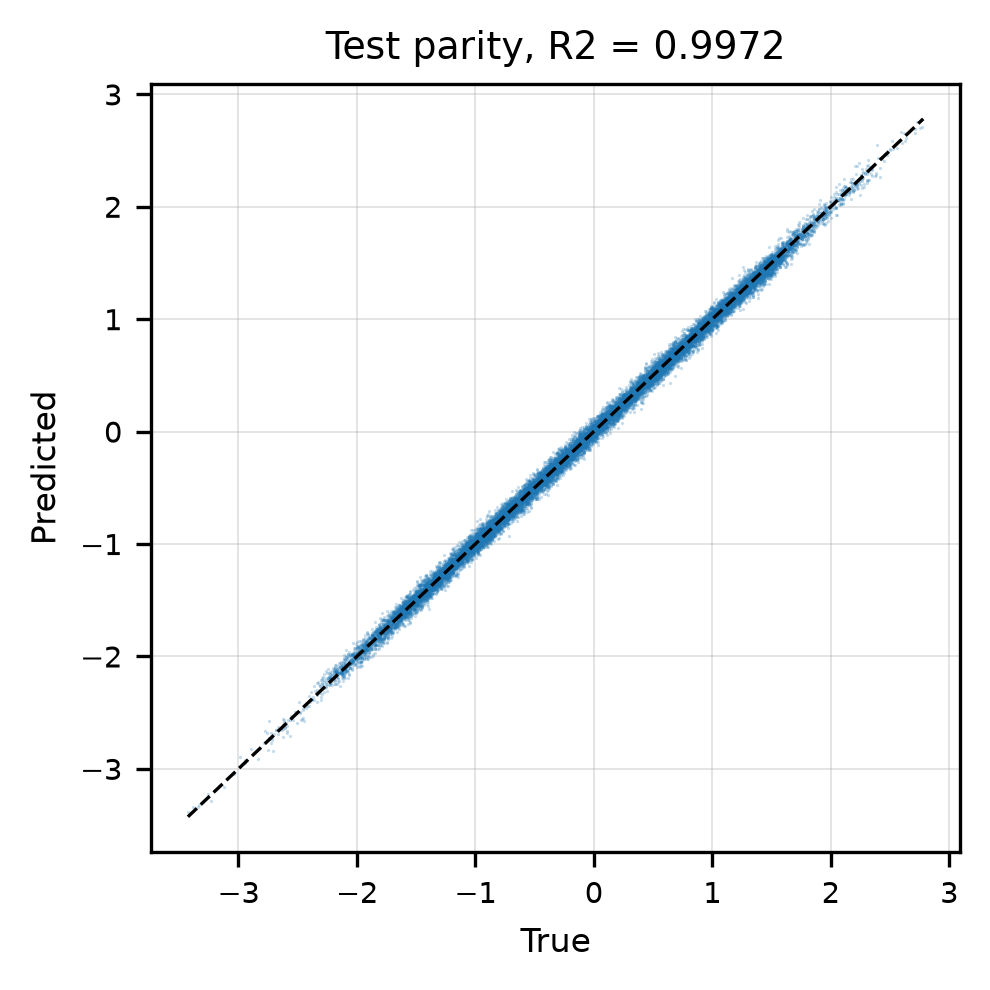

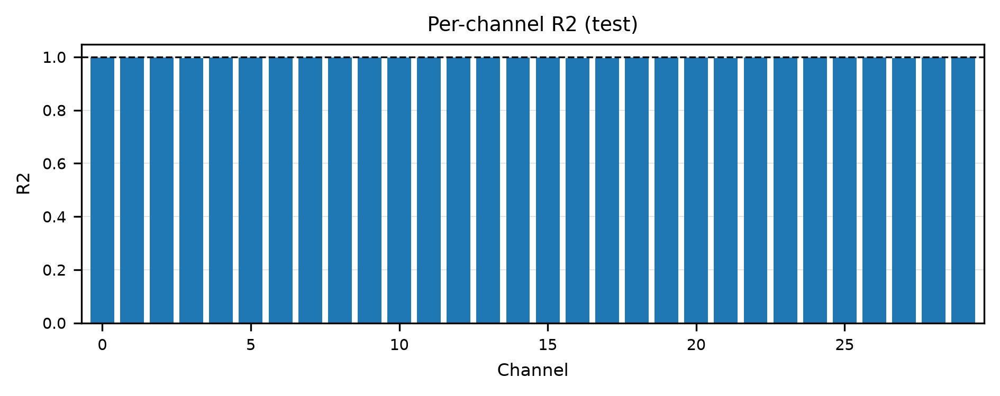

worst channel R2 0.9964 (channel 21)


In [17]:
Fig, Ax = PlotParity(test, XHatTest, Title=f"Test parity, R2 = {R2(test, XHatTest):.4f}")
plt.show()

Fig, Ax = PlotChannelBar(PerChannelR2(test, XHatTest), Title="Per-channel R2 (test)",
                         Baseline=1.0)
plt.show()
print(f"worst channel R2 {PerChannelR2(test, XHatTest).min():.4f} "
      f"(channel {int(PerChannelR2(test, XHatTest).argmin())})")

## True vs predicted states

b_t -> state probe R2 (test): [0.7951 0.7476 0.3958]


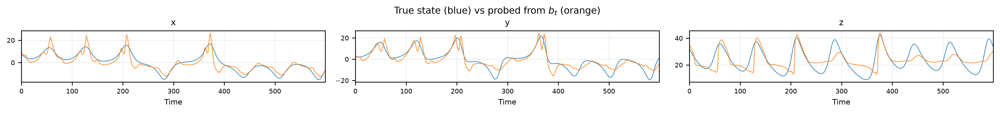

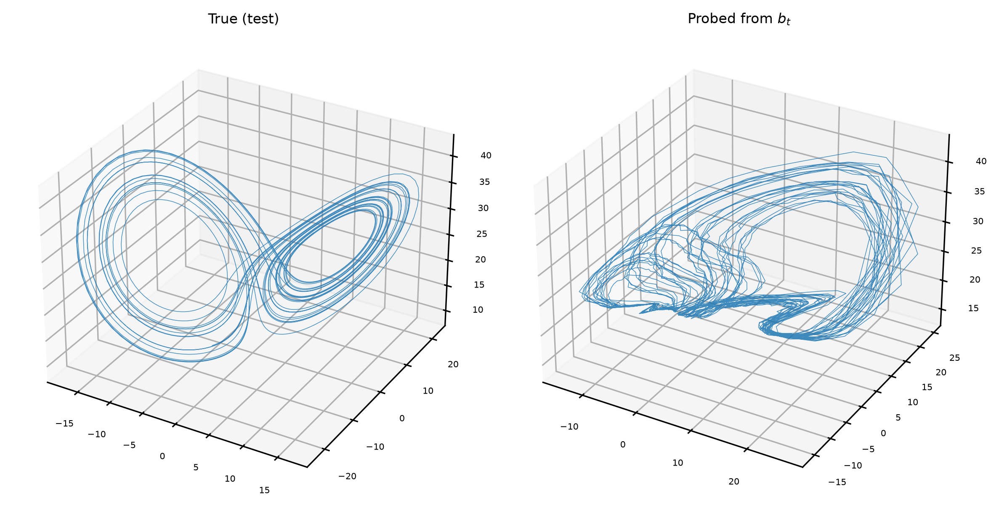

In [18]:
# The probe absorbs the arbitrary rotation/scale of the latent. Fit on TRAIN only.
with torch.no_grad():
    _, _, _, BTrain, _ = Best(XTrain)
    _, _, _, BTest, _ = Best(XTest)
BTrainNp, BTestNp = BTrain.cpu().numpy(), BTest.cpu().numpy()

ProbeB = FitProbe(BTrainNp, StatesTrain)
StatesHat = ApplyProbe(ProbeB, BTestNp)
print("b_t -> state probe R2 (test):",
      np.round([R2(StatesTest[:, i], StatesHat[:, i]) for i in range(3)], 4))

Fig, Axes = PlotNFeatSeries(np.stack([StatesTest[:600], StatesHat[:600]]),
                            Cols=3, Titles=["x", "y", "z"])
Fig.suptitle("True state (blue) vs probed from $b_t$ (orange)", fontsize=10, y=1.02)
plt.show()

Fig, Axes = PlotAttractor3D([StatesTest, StatesHat],
                            ["True (test)", "Probed from $b_t$"], Width=4.0, Height=4.0)
plt.show()

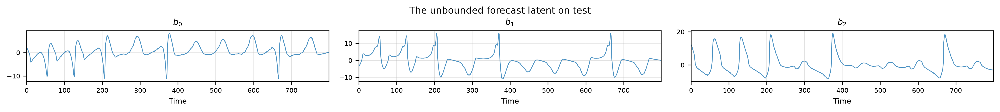

|b| range [-11.30, 19.29]  (unbounded by design)


In [19]:
Fig, Axes = PlotNFeatSeries(BTestNp[:800][None], Cols=3,
                            Titles=[f"$b_{i}$" for i in range(K)])
Fig.suptitle("The unbounded forecast latent on test", fontsize=10, y=1.02)
plt.show()
print(f"|b| range [{BTestNp.min():.2f}, {BTestNp.max():.2f}]  (unbounded by design)")

# Model B -- the phi sweep

One latent, one knob. `L = (1 - phi) * L_rec + phi * L_fcst`, swept end to end.

The endpoints are degenerate by construction and that is why they are included: at `phi = 0` the
GRU head receives no gradient at all, and at `phi = 1` the decoder is trained only through the
forecast path. They bracket the frontier honestly rather than flattering it.

In [20]:
def TrainJoint(Phi, Seed=0, Budget=BUDGET_S):
    SeedAll(Seed)
    Model = JointAEGRU(N, latent=16, width=WidthJoint).to(DEVICE)
    Opt = torch.optim.Adam(Model.parameters(), lr=LR)
    Hist = TimedTrain(lambda dl: JointEpoch(Model, Opt, dl, Phi),
                      EvalFn=lambda: ValScores(Model),
                      budget_s=Budget, name=f"phi {Phi:g}",
                      log_every=5, verbose=True)
    return Model, Hist


JointModels, JointHists = {}, {}
Sweep = tqdm(PHIS, desc="phi sweep")
for Phi in Sweep:
    Model, Hist = TrainJoint(Phi)
    JointModels[Phi], JointHists[Phi] = Model, Hist
    Sweep.write(f"phi {Phi:.2f} | {Hist['epochs_done']:3d} epochs | "
                f"val_recon {Hist['val_recon'][-1]:.5f} | "
                f"val_fcst {Hist['val_fcst'][-1]:.5f}")

phi sweep:   0%|          | 0/7 [00:00<?, ?it/s]

phi 0:   0%|          | 0/120 [00:00<?, ?s/s]

phi 0:   0%|          | 0/55 [00:00<?, ?it/s]

phi 0:   0%|          | 0/55 [00:00<?, ?it/s]

phi 0:   0%|          | 0/55 [00:00<?, ?it/s]

phi 0:   0%|          | 0/55 [00:00<?, ?it/s]

phi 0:   0%|          | 0/55 [00:00<?, ?it/s]

phi 0 epoch 0005 |   46.4s | recon 4.353e-03 | fcst 1.229e+00 | val_recon 3.945e-03 | val_fcst 1.244e+00


phi 0:   0%|          | 0/55 [00:00<?, ?it/s]

phi 0:   0%|          | 0/55 [00:00<?, ?it/s]

phi 0:   0%|          | 0/55 [00:00<?, ?it/s]

phi 0:   0%|          | 0/55 [00:00<?, ?it/s]

phi 0:   0%|          | 0/55 [00:00<?, ?it/s]

phi 0 epoch 0010 |   93.5s | recon 2.747e-03 | fcst 1.358e+00 | val_recon 2.786e-03 | val_fcst 1.332e+00


phi 0:   0%|          | 0/55 [00:00<?, ?it/s]

phi 0:   0%|          | 0/55 [00:00<?, ?it/s]

phi 0:   0%|          | 0/55 [00:00<?, ?it/s]

phi 0.00 |  13 epochs | val_recon 0.00260 | val_fcst 1.34390


phi 0.1:   0%|          | 0/120 [00:00<?, ?s/s]

phi 0.1:   0%|          | 0/55 [00:00<?, ?it/s]

phi 0.1:   0%|          | 0/55 [00:00<?, ?it/s]

phi 0.1:   0%|          | 0/55 [00:00<?, ?it/s]

phi 0.1:   0%|          | 0/55 [00:00<?, ?it/s]

phi 0.1:   0%|          | 0/55 [00:00<?, ?it/s]

phi 0.1 epoch 0005 |   46.7s | recon 4.606e-03 | fcst 1.596e-02 | val_recon 4.271e-03 | val_fcst 1.340e-02


phi 0.1:   0%|          | 0/55 [00:00<?, ?it/s]

phi 0.1:   0%|          | 0/55 [00:00<?, ?it/s]

phi 0.1:   0%|          | 0/55 [00:00<?, ?it/s]

phi 0.1:   0%|          | 0/55 [00:00<?, ?it/s]

phi 0.1:   0%|          | 0/55 [00:00<?, ?it/s]

phi 0.1 epoch 0010 |   93.2s | recon 2.956e-03 | fcst 8.328e-03 | val_recon 2.949e-03 | val_fcst 7.236e-03


phi 0.1:   0%|          | 0/55 [00:00<?, ?it/s]

phi 0.1:   0%|          | 0/55 [00:00<?, ?it/s]

phi 0.1:   0%|          | 0/55 [00:00<?, ?it/s]

phi 0.10 |  13 epochs | val_recon 0.00279 | val_fcst 0.00588


phi 0.25:   0%|          | 0/120 [00:00<?, ?s/s]

phi 0.25:   0%|          | 0/55 [00:00<?, ?it/s]

phi 0.25:   0%|          | 0/55 [00:00<?, ?it/s]

phi 0.25:   0%|          | 0/55 [00:00<?, ?it/s]

phi 0.25:   0%|          | 0/55 [00:00<?, ?it/s]

phi 0.25:   0%|          | 0/55 [00:00<?, ?it/s]

phi 0.25 epoch 0005 |   50.0s | recon 4.858e-03 | fcst 1.120e-02 | val_recon 4.575e-03 | val_fcst 1.022e-02


phi 0.25:   0%|          | 0/55 [00:00<?, ?it/s]

phi 0.25:   0%|          | 0/55 [00:00<?, ?it/s]

phi 0.25:   0%|          | 0/55 [00:00<?, ?it/s]

phi 0.25:   0%|          | 0/55 [00:00<?, ?it/s]

phi 0.25:   0%|          | 0/55 [00:00<?, ?it/s]

phi 0.25 epoch 0010 |   97.6s | recon 3.179e-03 | fcst 6.700e-03 | val_recon 3.266e-03 | val_fcst 7.061e-03


phi 0.25:   0%|          | 0/55 [00:00<?, ?it/s]

phi 0.25:   0%|          | 0/55 [00:00<?, ?it/s]

phi 0.25:   0%|          | 0/55 [00:00<?, ?it/s]

phi 0.25 |  13 epochs | val_recon 0.00296 | val_fcst 0.00493


phi 0.5:   0%|          | 0/120 [00:00<?, ?s/s]

phi 0.5:   0%|          | 0/55 [00:00<?, ?it/s]

phi 0.5:   0%|          | 0/55 [00:00<?, ?it/s]

phi 0.5:   0%|          | 0/55 [00:00<?, ?it/s]

phi 0.5:   0%|          | 0/55 [00:00<?, ?it/s]

phi 0.5:   0%|          | 0/55 [00:00<?, ?it/s]

phi 0.5 epoch 0005 |   46.5s | recon 6.500e-03 | fcst 1.157e-02 | val_recon 5.888e-03 | val_fcst 9.104e-03


phi 0.5:   0%|          | 0/55 [00:00<?, ?it/s]

phi 0.5:   0%|          | 0/55 [00:00<?, ?it/s]

phi 0.5:   0%|          | 0/55 [00:00<?, ?it/s]

phi 0.5:   0%|          | 0/55 [00:00<?, ?it/s]

phi 0.5:   0%|          | 0/55 [00:00<?, ?it/s]

phi 0.5 epoch 0010 |   92.3s | recon 3.849e-03 | fcst 7.231e-03 | val_recon 4.238e-03 | val_fcst 8.061e-03


phi 0.5:   0%|          | 0/55 [00:00<?, ?it/s]

phi 0.5:   0%|          | 0/55 [00:00<?, ?it/s]

phi 0.5:   0%|          | 0/55 [00:00<?, ?it/s]

phi 0.5:   0%|          | 0/55 [00:00<?, ?it/s]

phi 0.50 |  14 epochs | val_recon 0.00343 | val_fcst 0.00652


phi 0.75:   0%|          | 0/120 [00:00<?, ?s/s]

phi 0.75:   0%|          | 0/55 [00:00<?, ?it/s]

phi 0.75:   0%|          | 0/55 [00:00<?, ?it/s]

phi 0.75:   0%|          | 0/55 [00:00<?, ?it/s]

phi 0.75:   0%|          | 0/55 [00:00<?, ?it/s]

phi 0.75:   0%|          | 0/55 [00:00<?, ?it/s]

phi 0.75 epoch 0005 |   45.5s | recon 9.342e-03 | fcst 1.160e-02 | val_recon 9.291e-03 | val_fcst 1.046e-02


phi 0.75:   0%|          | 0/55 [00:00<?, ?it/s]

phi 0.75:   0%|          | 0/55 [00:00<?, ?it/s]

phi 0.75:   0%|          | 0/55 [00:00<?, ?it/s]

phi 0.75:   0%|          | 0/55 [00:00<?, ?it/s]

phi 0.75:   0%|          | 0/55 [00:00<?, ?it/s]

phi 0.75 epoch 0010 |   90.9s | recon 4.965e-03 | fcst 7.145e-03 | val_recon 5.273e-03 | val_fcst 9.713e-03


phi 0.75:   0%|          | 0/55 [00:00<?, ?it/s]

phi 0.75:   0%|          | 0/55 [00:00<?, ?it/s]

phi 0.75:   0%|          | 0/55 [00:00<?, ?it/s]

phi 0.75:   0%|          | 0/55 [00:00<?, ?it/s]

phi 0.75 |  14 epochs | val_recon 0.00435 | val_fcst 0.00751


phi 0.9:   0%|          | 0/120 [00:00<?, ?s/s]

phi 0.9:   0%|          | 0/55 [00:00<?, ?it/s]

phi 0.9:   0%|          | 0/55 [00:00<?, ?it/s]

phi 0.9:   0%|          | 0/55 [00:00<?, ?it/s]

phi 0.9:   0%|          | 0/55 [00:00<?, ?it/s]

phi 0.9:   0%|          | 0/55 [00:00<?, ?it/s]

phi 0.9 epoch 0005 |   45.8s | recon 1.385e-02 | fcst 1.220e-02 | val_recon 1.400e-02 | val_fcst 1.165e-02


phi 0.9:   0%|          | 0/55 [00:00<?, ?it/s]

phi 0.9:   0%|          | 0/55 [00:00<?, ?it/s]

phi 0.9:   0%|          | 0/55 [00:00<?, ?it/s]

phi 0.9:   0%|          | 0/55 [00:00<?, ?it/s]

phi 0.9:   0%|          | 0/55 [00:00<?, ?it/s]

phi 0.9 epoch 0010 |   91.5s | recon 6.671e-03 | fcst 7.252e-03 | val_recon 6.932e-03 | val_fcst 8.866e-03


phi 0.9:   0%|          | 0/55 [00:00<?, ?it/s]

phi 0.9:   0%|          | 0/55 [00:00<?, ?it/s]

phi 0.9:   0%|          | 0/55 [00:00<?, ?it/s]

phi 0.9:   0%|          | 0/55 [00:00<?, ?it/s]

phi 0.90 |  14 epochs | val_recon 0.00559 | val_fcst 0.00749


phi 1:   0%|          | 0/120 [00:00<?, ?s/s]

phi 1:   0%|          | 0/55 [00:00<?, ?it/s]

phi 1:   0%|          | 0/55 [00:00<?, ?it/s]

phi 1:   0%|          | 0/55 [00:00<?, ?it/s]

phi 1:   0%|          | 0/55 [00:00<?, ?it/s]

phi 1:   0%|          | 0/55 [00:00<?, ?it/s]

phi 1 epoch 0005 |   45.2s | recon 2.497e-02 | fcst 1.340e-02 | val_recon 2.595e-02 | val_fcst 1.349e-02


phi 1:   0%|          | 0/55 [00:00<?, ?it/s]

phi 1:   0%|          | 0/55 [00:00<?, ?it/s]

phi 1:   0%|          | 0/55 [00:00<?, ?it/s]

phi 1:   0%|          | 0/55 [00:00<?, ?it/s]

phi 1:   0%|          | 0/55 [00:00<?, ?it/s]

phi 1 epoch 0010 |   90.4s | recon 1.211e-02 | fcst 7.074e-03 | val_recon 1.259e-02 | val_fcst 8.088e-03


phi 1:   0%|          | 0/55 [00:00<?, ?it/s]

phi 1:   0%|          | 0/55 [00:00<?, ?it/s]

phi 1:   0%|          | 0/55 [00:00<?, ?it/s]

phi 1:   0%|          | 0/55 [00:00<?, ?it/s]

phi 1.00 |  14 epochs | val_recon 0.01087 | val_fcst 0.00843


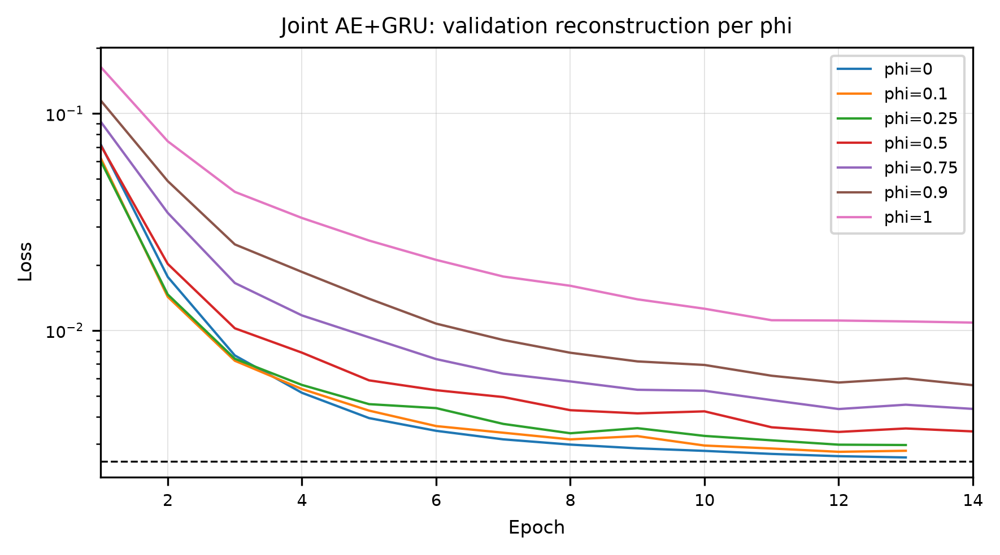

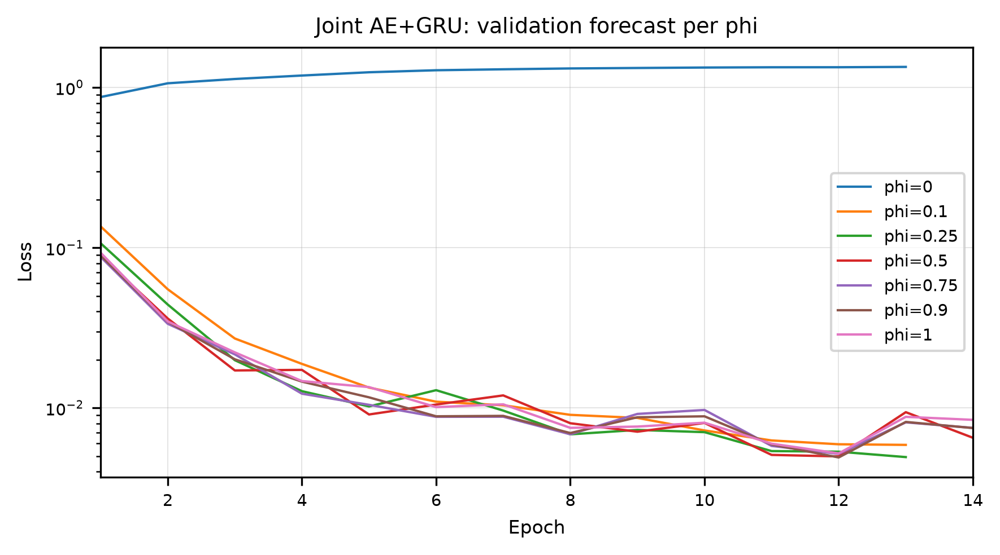

,phi,epochs,val_recon,val_fcst
0,0.00,13,0.00260,1.34390
1,0.10,13,0.00279,0.00588
2,0.25,13,0.00296,0.00493
3,0.50,14,0.00343,0.00652
4,0.75,14,0.00435,0.00751
5,0.90,14,0.00559,0.00749
6,1.00,14,0.01087,0.00843


In [21]:
# The knob, seen directly: reconstruction and forecast validation losses as phi moves.
Fig, Ax = PlotLossCurves({f"phi={p:g}": JointHists[p]["val_recon"] for p in PHIS})
Ax.axhline(NOISE_FLOOR, color="k", linestyle="--", linewidth=0.8)
Ax.set_title("Joint AE+GRU: validation reconstruction per phi", fontsize=9)
plt.show()

Fig, Ax = PlotLossCurves({f"phi={p:g}": JointHists[p]["val_fcst"] for p in PHIS})
Ax.set_title("Joint AE+GRU: validation forecast per phi", fontsize=9)
plt.show()

Knob = pd.DataFrame([{"phi": p, "epochs": JointHists[p]["epochs_done"],
                      "val_recon": JointHists[p]["val_recon"][-1],
                      "val_fcst": JointHists[p]["val_fcst"][-1]} for p in PHIS])
Knob.round(5)

# Model C -- the PINN

An autoencoder whose 3-d latent is forced to obey the true Lorenz equations, so the forecaster
has **no learned parameters**: rollout is RK4 integration of the known field.

Two caveats stated up front. This model is handed the *exact* governing equations, which no
other model here gets — it is an oracle and upper-bounds what physics-decoupling can buy. And
because `lift()` z-scores the states before lifting, the recoverable latent is standardised
Lorenz, not physical Lorenz; the learnable affine carries that gauge and is seeded from the true
state statistics. Nothing is supervised on `states` — only the affine *initialisation* uses it.

The misspecified run (rho = 26 instead of 28) is the honest control: it asks how much of the
advantage survives when the physics is merely approximately right, which is the only situation
that ever obtains outside a synthetic testbed.

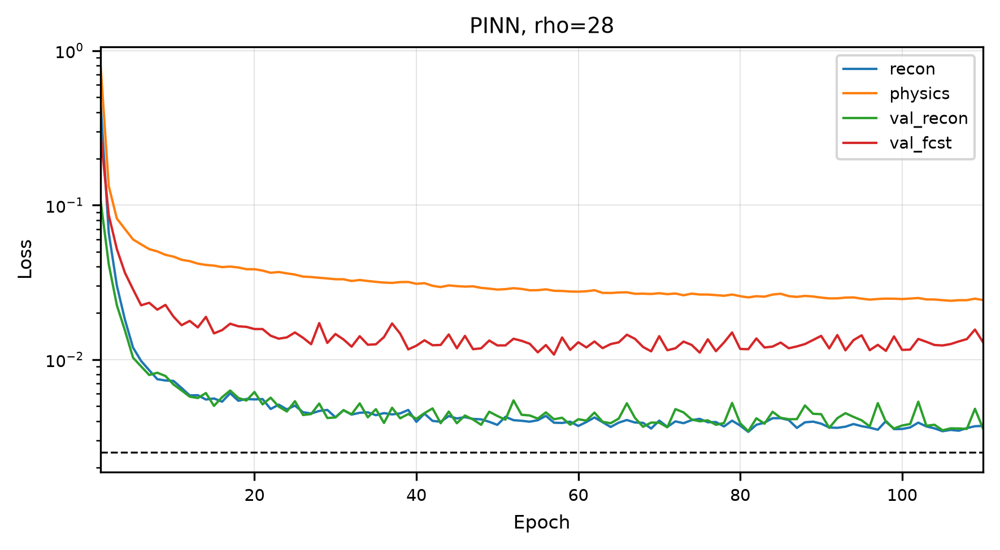

pinn rho=28 (seed 0) epoch 0110 |  114.4s | recon 3.723e-03 | physics 2.429e-02 | val_recon 3.578e-03 | val_fcst 1.295e-02


pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn rho=28 (seed 0) epoch 0111 |  115.6s | recon 3.456e-03 | physics 2.412e-02 | val_recon 3.797e-03 | val_fcst 1.143e-02


pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn rho=28 (seed 0) epoch 0112 |  116.7s | recon 3.912e-03 | physics 2.465e-02 | val_recon 3.978e-03 | val_fcst 1.395e-02


pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn rho=28 (seed 0) epoch 0113 |  117.7s | recon 3.558e-03 | physics 2.411e-02 | val_recon 3.998e-03 | val_fcst 1.225e-02


pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn rho=28 (seed 0) epoch 0114 |  118.7s | recon 3.600e-03 | physics 2.384e-02 | val_recon 3.494e-03 | val_fcst 1.424e-02


pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn rho=28 (seed 0) epoch 0115 |  119.8s | recon 3.432e-03 | physics 2.367e-02 | val_recon 4.018e-03 | val_fcst 1.423e-02


pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn rho=28 (seed 0) epoch 0116 |  120.0s | recon 3.615e-03 | physics 2.226e-02 | val_recon 3.546e-03 | val_fcst 1.129e-02


pinn rho=28 (seed 1):   0%|          | 0/120 [00:00<?, ?s/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn rho=28 (seed 2):   0%|          | 0/120 [00:00<?, ?s/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn rho=26 (seed 0):   0%|          | 0/120 [00:00<?, ?s/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

pinn:   0%|          | 0/55 [00:00<?, ?it/s]

In [22]:
T3 = torch.stack([XTrain[:-2], XTrain[1:-1], XTrain[2:]], dim=1)
print(f"physics triples {tuple(T3.shape)}")


def TrainPinn(Seed, Budget=BUDGET_S, Rho=28.0, Verbose=True):
    SeedAll(Seed)
    Model = PhysicsLatentAE(N, width=WidthPinn, dt=DT, rho=Rho).to(DEVICE)
    Model.StatsInit(StatesTrain)
    Opt = torch.optim.Adam(Model.parameters(), lr=LR)
    Hist = TimedTrain(lambda dl: PinnEpoch(Model, Opt, T3, dl),
                      EvalFn=lambda: ValScores(Model),
                      budget_s=Budget, name=f"pinn rho={Rho:g} (seed {Seed})",
                      PlotFn=LossPlot(["recon", "physics", "val_recon", "val_fcst"],
                                      Floor=NOISE_FLOOR,
                                      Title=f"PINN, rho={Rho:g}") if Verbose else None,
                      plot_every=PLOT_EVERY, verbose=Verbose)
    return Model, Hist


PinnModels, PinnHists = [], []
for Seed in SEEDS:
    Model, Hist = TrainPinn(Seed, Verbose=(Seed == SEEDS[0]))
    PinnModels.append(Model); PinnHists.append(Hist)

PinnBadModel, PinnBadHist = TrainPinn(SEEDS[0], Rho=26.0, Verbose=False)

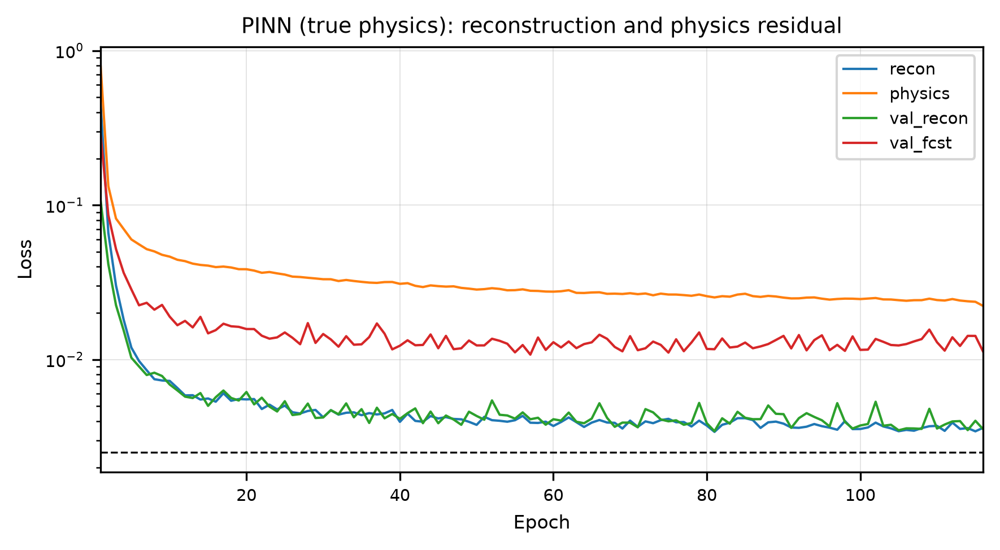

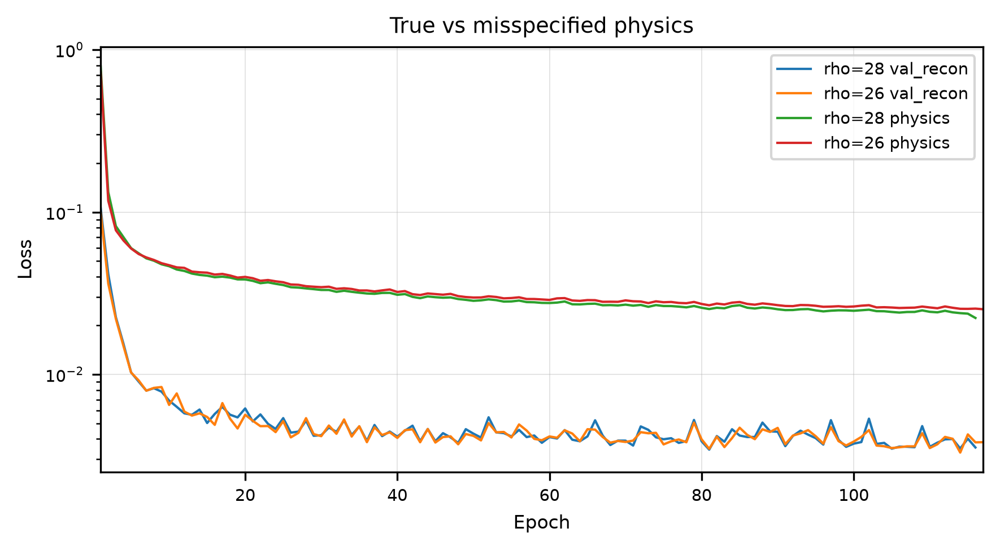

pinn rho=28 | 116 epochs | val_recon 0.00355 | physics 0.0223
pinn rho=26 | 117 epochs | val_recon 0.00382 | physics 0.0252


In [23]:
Fig, Ax = PlotLossCurves({k: PinnHists[0][k] for k in ("recon", "physics",
                                                       "val_recon", "val_fcst")})
Ax.axhline(NOISE_FLOOR, color="k", linestyle="--", linewidth=0.8)
Ax.set_title("PINN (true physics): reconstruction and physics residual", fontsize=9)
plt.show()

Fig, Ax = PlotLossCurves({"rho=28 val_recon": PinnHists[0]["val_recon"],
                          "rho=26 val_recon": PinnBadHist["val_recon"],
                          "rho=28 physics": PinnHists[0]["physics"],
                          "rho=26 physics": PinnBadHist["physics"]})
Ax.set_title("True vs misspecified physics", fontsize=9)
plt.show()

print(f"pinn rho=28 | {PinnHists[0]['epochs_done']} epochs | "
      f"val_recon {PinnHists[0]['val_recon'][-1]:.5f} | "
      f"physics {PinnHists[0]['physics'][-1]:.4f}")
print(f"pinn rho=26 | {PinnBadHist['epochs_done']} epochs | "
      f"val_recon {PinnBadHist['val_recon'][-1]:.5f} | "
      f"physics {PinnBadHist['physics'][-1]:.4f}")

# Evaluation

In [24]:
EvalKw = dict(dt=DT, threshold=THRESHOLD, scale=SCALE,
              noise_floor=NOISE_FLOOR, bounds=BOUNDS)


def Agg(Models, Label, **Kw):
    """Evaluate every seed of a model and average, keeping the spread."""
    Runs = [EvaluateModel(m, Warm, Fut, **EvalKw, **Kw) for m in Models]
    Out = {"model": Label, "n_seeds": len(Runs)}
    for k in Runs[0]:
        if k == "curve":
            Out["curve"] = np.mean([r["curve"] for r in Runs], axis=0)
        elif isinstance(Runs[0][k], (int, float, bool)):
            Vals = [float(r[k]) for r in Runs]
            Out[k] = float(np.mean(Vals))
            Out[k + "_std"] = float(np.std(Vals))
    return Out


Results = {}
Bar = tqdm(total=3 + len(PHIS), desc="evaluating")
Results["Ours (two-stage)"] = Agg(OursModels, "Ours (two-stage)"); Bar.update()
Results["PINN (true physics)"] = Agg(PinnModels, "PINN (true physics)"); Bar.update()
Results["PINN (rho=26)"] = Agg([PinnBadModel], "PINN (rho=26)"); Bar.update()
for Phi in PHIS:
    Results[f"phi={Phi:g}"] = Agg([JointModels[Phi]], f"phi={Phi:g}"); Bar.update()
Bar.close()

# Trivial references. Anything that cannot beat these is broken, not interesting.
for Name, Pred in [("persistence", PersistenceRollout(WarmNp, HORIZON)),
                   ("climatology", MeanRollout(WarmNp, HORIZON, train.mean(0)))]:
    Fm = ForecastMetrics(FutNp, Pred, DT, THRESHOLD, SCALE, BOUNDS)
    Results[Name] = {"model": Name, "recon_nrmse": np.nan, "recon_mse": np.nan,
                     "recon_r2": np.nan, **Fm}

print(f"evaluated {len(Results)} configurations on {Warm.shape[0]} held-out windows")

evaluating:   0%|          | 0/10 [00:00<?, ?it/s]

evaluated 12 configurations on 64 held-out windows


## Reconstruction

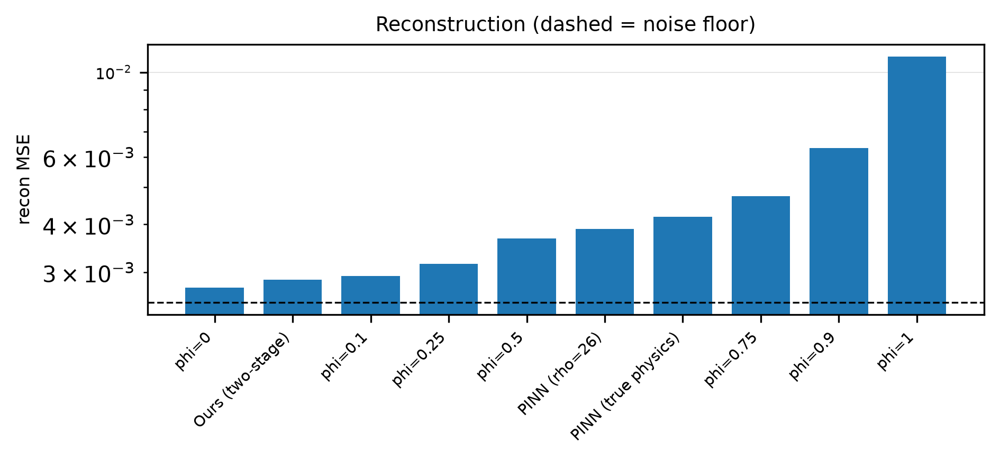

,model,recon MSE,x noise floor,recon NRMSE,R2,worst channel R2
0,phi=0,0.00273,1.09140,0.05120,0.99738,0.99652
1,Ours (two-stage),0.00286,1.14466,0.05242,0.99725,0.99659
2,phi=0.1,0.00293,1.17049,0.05302,0.99719,0.99649
3,phi=0.25,0.00315,1.25904,0.05499,0.99697,0.99593
4,phi=0.5,0.00367,1.46806,0.05938,0.99647,0.99503
5,PINN (rho=26),0.00390,1.55834,0.06118,0.99625,0.99445
6,PINN (true physics),0.00418,1.67259,0.06315,0.99598,0.99386
7,phi=0.75,0.00475,1.89822,0.06752,0.99544,0.99233
8,phi=0.9,0.00632,2.52940,0.07795,0.99392,0.98773
9,phi=1,0.01098,4.39116,0.10270,0.98944,0.96887


In [25]:
Rec = pd.DataFrame([{"model": r["model"],
                     "recon MSE": r.get("recon_mse"),
                     "x noise floor": r.get("recon_mse_over_floor"),
                     "recon NRMSE": r.get("recon_nrmse"),
                     "R2": r.get("recon_r2"),
                     "worst channel R2": r.get("recon_r2_worst")}
                    for r in Results.values()
                    if not np.isnan(r.get("recon_mse", np.nan))])
Rec = Rec.sort_values("recon MSE").reset_index(drop=True)

Fig, Ax = plt.subplots(figsize=(6.4, 3.0), dpi=300)
Ax.bar(np.arange(len(Rec)), Rec["recon MSE"], width=0.75)
Ax.axhline(NOISE_FLOOR, color="k", linestyle="--", linewidth=0.8)
Ax.set_xticks(np.arange(len(Rec))); Ax.set_xticklabels(Rec["model"], rotation=45,
                                                       ha="right", fontsize=6)
Ax.set_yscale("log"); Ax.set_ylabel("recon MSE", fontsize=8)
Ax.set_title("Reconstruction (dashed = noise floor)", fontsize=9)
Ax.tick_params(labelsize=7); Ax.grid(True, axis="y", linewidth=0.4, alpha=0.4)
Ax.set_axisbelow(True); Fig.tight_layout()
plt.show()

Rec.round(5)

## Forecast

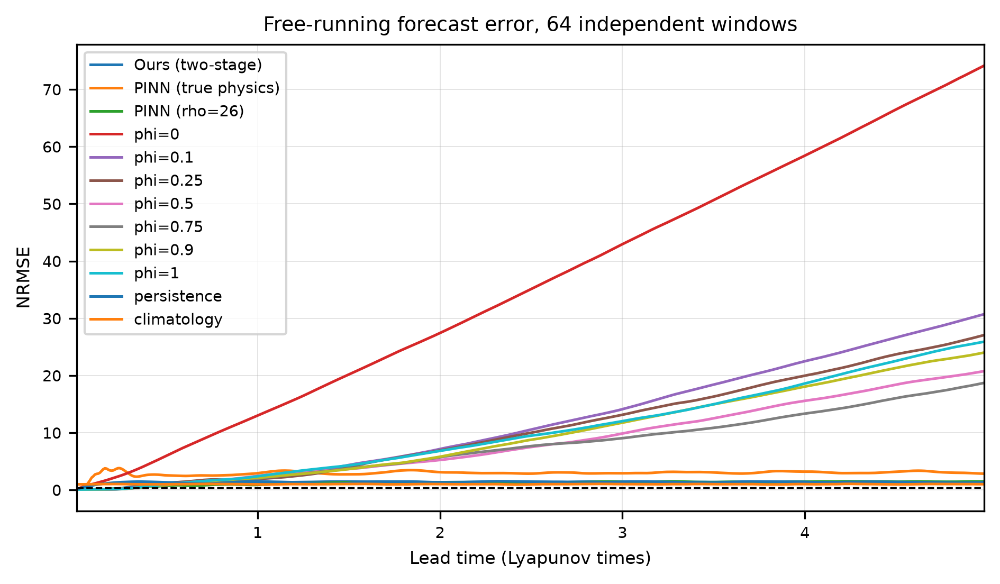

In [26]:
Curves = {k: r["curve"] for k, r in Results.items()}
Fig, Ax = PlotHorizonCurves(Curves, Dt=DT, Lam=LAMBDA_MAX, Threshold=THRESHOLD)
Ax.set_title(f"Free-running forecast error, {Warm.shape[0]} independent windows", fontsize=9)
plt.show()

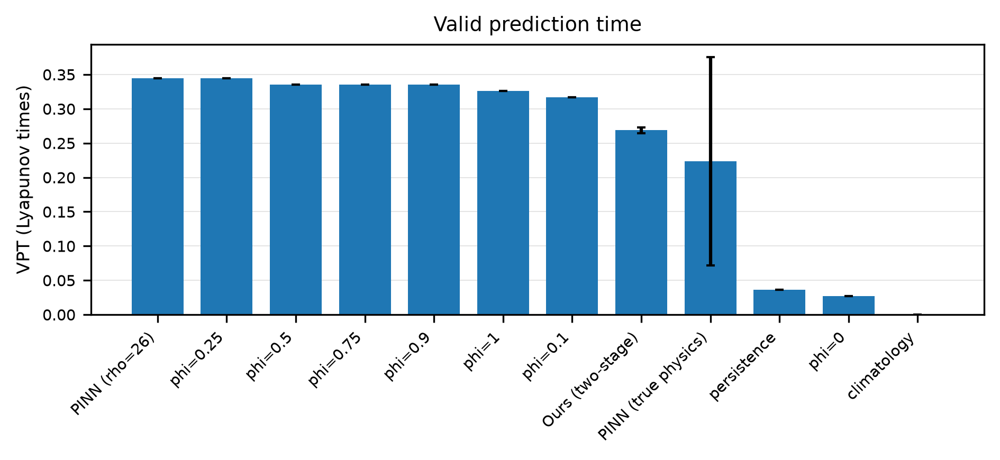

,model,VPT (Lyap),VPT std,censored,NRMSE @ H,divergence
0,PINN (rho=26),0.3443,0.0000,0.0,1.2565,0.7812
1,phi=0.25,0.3443,0.0000,0.0,13.8068,1.0000
2,phi=0.5,0.3352,0.0000,0.0,10.6726,1.0000
3,phi=0.75,0.3352,0.0000,0.0,9.5044,1.0000
4,phi=0.9,0.3352,0.0000,0.0,12.4134,1.0000
5,phi=1,0.3262,0.0000,0.0,13.0464,1.0000
6,phi=0.1,0.3171,0.0000,0.0,15.4178,1.0000
7,Ours (two-stage),0.2688,0.0043,0.0,1.3397,0.0729
8,PINN (true physics),0.2235,0.1517,0.0,3.0139,0.7292
9,persistence,0.0362,0.0000,False,1.3505,0.0000


In [27]:
Fc = pd.DataFrame([{"model": r["model"],
                    "VPT (Lyap)": r.get("vpt"),
                    "VPT std": r.get("vpt_std", 0.0),
                    "censored": r.get("vpt_censored"),
                    "NRMSE @ H": r.get("fcst_nrmse_full"),
                    "divergence": r.get("divergence")}
                   for r in Results.values()])
Fc = Fc.sort_values("VPT (Lyap)", ascending=False).reset_index(drop=True)

Fig, Ax = plt.subplots(figsize=(6.4, 3.0), dpi=300)
Ax.bar(np.arange(len(Fc)), Fc["VPT (Lyap)"], yerr=Fc["VPT std"], width=0.75, capsize=2)
Ax.set_xticks(np.arange(len(Fc))); Ax.set_xticklabels(Fc["model"], rotation=45,
                                                      ha="right", fontsize=6)
Ax.set_ylabel("VPT (Lyapunov times)", fontsize=8)
Ax.set_title("Valid prediction time", fontsize=9)
Ax.tick_params(labelsize=7); Ax.grid(True, axis="y", linewidth=0.4, alpha=0.4)
Ax.set_axisbelow(True); Fig.tight_layout()
plt.show()

Fc.round(4)

`censored = True` means the error curve never crossed the threshold inside the horizon, so the
VPT is a lower bound rather than a measurement — read those rows as "at least this".

### What the rollouts actually look like

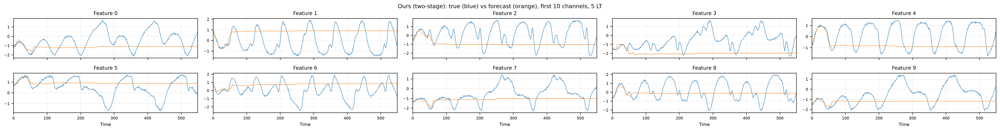

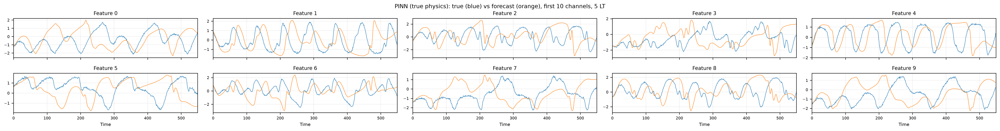

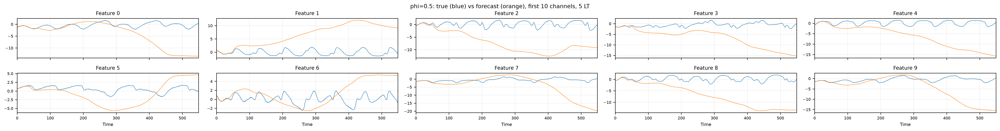

In [28]:
Show = {"Ours (two-stage)": OursModels[0], "PINN (true physics)": PinnModels[0],
        f"phi={PHIS[len(PHIS) // 2]:g}": JointModels[PHIS[len(PHIS) // 2]]}
Win = 0
with torch.no_grad():
    Rolls = {k: m.Rollout(Warm[Win:Win + 1], HORIZON)[0].cpu().numpy()
             for k, m in Show.items()}

for Name, Pred in Rolls.items():
    Fig, Axes = PlotNFeatSeries(np.stack([FutNp[Win, :, :10], Pred[:, :10]]), Cols=5)
    Fig.suptitle(f"{Name}: true (blue) vs forecast (orange), first 10 channels, 5 LT",
                 fontsize=10, y=1.01)
    plt.show()

obs -> state probe R2 on test: [0.9775 0.9928 0.9953]


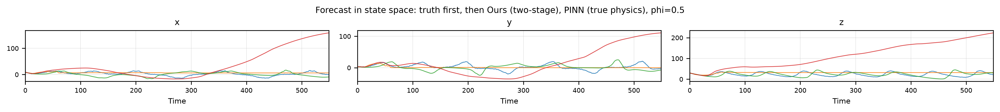

In [29]:
# Same rollouts pushed through the observation -> state probe, so the divergence
# is visible in physical coordinates.
ProbeW = FitProbe(train, StatesTrain)
print("obs -> state probe R2 on test:",
      np.round([R2(StatesTest[:, i], ApplyProbe(ProbeW, test)[:, i]) for i in range(3)], 4))

TrueState = ApplyProbe(ProbeW, FutNp[Win])
Fig, Axes = PlotNFeatSeries(
    np.stack([TrueState] + [ApplyProbe(ProbeW, p) for p in Rolls.values()]),
    Cols=3, Titles=["x", "y", "z"])
Fig.suptitle("Forecast in state space: truth first, then " + ", ".join(Rolls), fontsize=9, y=1.02)
plt.show()

## Bounded latent through the rollout

The residual-sigmoid `LatentMappingDynamic` keeps `C` inside `[0, 1]` at every step of an
arbitrarily long rollout *by construction*, so the violation count is a correctness check rather
than a result — a non-zero value is a bug. What is a result is whether the decoded forecast stays
inside the range the model was trained on, which no baseline here guarantees.

C outside [0,1] over 5500 steps x 32 rollouts: 0.000000
C saturated (outside [0.02, 0.98]): 0.9951
|b| max during rollout: 9289.92


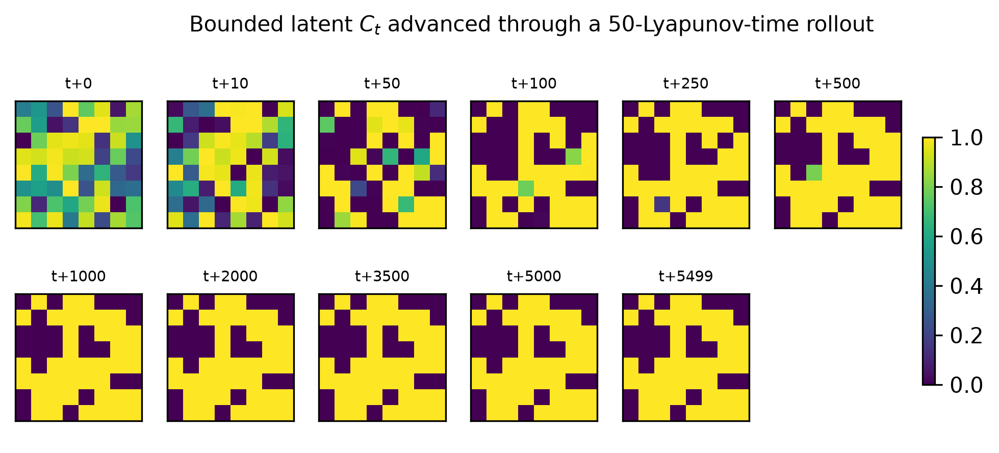

In [30]:
with torch.no_grad():
    XRoll, BRoll, CRoll = OursModels[0].RolloutLatents(WarmC, CLIMATE)
CRollNp, BRollNp = CRoll.cpu().numpy(), BRoll.cpu().numpy()

assert BoundViolation(CRollNp) == 0.0, "bounded latent escaped [0,1] -- this is a bug"
print(f"C outside [0,1] over {CLIMATE} steps x {CRollNp.shape[0]} rollouts: "
      f"{BoundViolation(CRollNp):.6f}")
print(f"C saturated (outside [0.02, 0.98]): {Saturation(CRollNp):.4f}")
print(f"|b| max during rollout: {np.abs(BRollNp).max():.2f}")

Steps = [0, 10, 50, 100, 250, 500, 1000, 2000, 3500, 5000, CLIMATE - 1]
Fig, Axes = PlotMatrixGrid([CRollNp[0, s] for s in Steps],
                           Titles=[f"t+{s}" for s in Steps], Cols=6)
Fig.suptitle("Bounded latent $C_t$ advanced through a 50-Lyapunov-time rollout",
             fontsize=10, y=1.03)
plt.show()

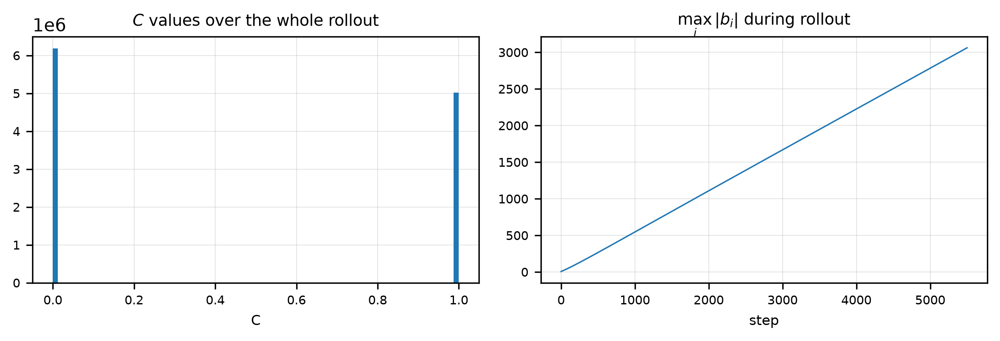

In [31]:
Fig, Ax = plt.subplots(1, 2, figsize=(8.0, 2.8), dpi=300)
Ax[0].hist(CRollNp.ravel(), bins=80)
Ax[0].set_title("$C$ values over the whole rollout", fontsize=9)
Ax[0].set_xlabel("C", fontsize=8); Ax[0].tick_params(labelsize=7)
Ax[0].grid(True, linewidth=0.4, alpha=0.4); Ax[0].set_axisbelow(True)

Ax[1].plot(np.abs(BRollNp[0]).max(axis=1), linewidth=0.8)
Ax[1].set_title("$\\max_i |b_i|$ during rollout", fontsize=9)
Ax[1].set_xlabel("step", fontsize=8); Ax[1].tick_params(labelsize=7)
Ax[1].grid(True, linewidth=0.4, alpha=0.4); Ax[1].set_axisbelow(True)
Fig.tight_layout()
plt.show()

## Climate: does the long rollout stay on the attractor?

Short-horizon error says nothing about this. A model can track for two Lyapunov times and then
settle onto a fixed point or a limit cycle, and its NRMSE curve would look no different from one
that keeps orbiting correctly. These statistics run to 50 Lyapunov times, long past the point
where pointwise error has saturated.

In [32]:
@torch.no_grad()
def ClimateOf(Model, **Kw):
    Model.eval()
    Pred = Model.Rollout(WarmC, CLIMATE, **Kw).cpu().numpy()
    St = AttractorStats(FutCNp, Pred)
    St["divergence"] = float(((Pred < BOUNDS[0]) | (Pred > BOUNDS[1])).any(axis=(1, 2)).mean())
    St["final_nrmse"] = float(NRMSE(FutCNp[:, -500:], Pred[:, -500:], SCALE))
    return St, Pred


ClimateModels = {"Ours (two-stage)": OursModels[0],
                 "PINN (true physics)": PinnModels[0],
                 "PINN (rho=26)": PinnBadModel}
ClimateModels.update({f"phi={p:g}": JointModels[p]
                      for p in (PHIS[0], PHIS[len(PHIS) // 2], PHIS[-1])})

Climate, ClimatePreds = {}, {}
for Name, Model in tqdm(ClimateModels.items(), desc="climate"):
    Climate[Name], ClimatePreds[Name] = ClimateOf(Model)

pd.DataFrame([{"model": k, **v} for k, v in Climate.items()]).round(4)

climate:   0%|          | 0/6 [00:00<?, ?it/s]

,model,wasserstein,wasserstein_max,spectrum_log_err,divergence,final_nrmse
0,Ours (two-stage),0.6954,1.0370,3.2885,0.0,1.2831
1,PINN (true physics),0.0816,0.1226,2.1044,1.0,1.4317
2,PINN (rho=26),0.0666,0.1506,2.1981,1.0,1.3810
3,phi=0,351.7275,649.7199,9.6317,1.0,848.0980
4,phi=0.5,137.0141,173.9166,8.1710,1.0,362.2958
5,phi=1,122.7250,168.7277,7.8936,1.0,321.8023


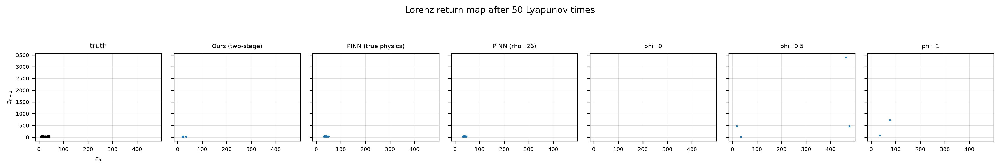

In [33]:
# The Lorenz map: successive maxima of z, recovered through the probe. The true
# system traces a thin tent; a model that has the climate but not the geometry
# produces a visibly fattened or collapsed one.
TrueMap = ZMaxMap(ApplyProbe(ProbeW, FutCNp[0])[:, 2])
Names = list(ClimatePreds)

Fig, Axes = plt.subplots(1, len(Names) + 1, figsize=(2.3 * (len(Names) + 1), 2.5),
                         dpi=300, sharex=True, sharey=True)
Axes[0].scatter(TrueMap[:, 0], TrueMap[:, 1], s=1.5, c="k")
Axes[0].set_title("truth", fontsize=8)
for Ax, Name in zip(Axes[1:], Names):
    M = ZMaxMap(ApplyProbe(ProbeW, ClimatePreds[Name][0])[:, 2])
    if len(M):
        Ax.scatter(M[:, 0], M[:, 1], s=1.5)
    Ax.set_title(Name, fontsize=7)
for Ax in Axes:
    Ax.tick_params(labelsize=6)
    Ax.grid(True, linewidth=0.3, alpha=0.4); Ax.set_axisbelow(True)
Axes[0].set_xlabel("$z_n$", fontsize=7); Axes[0].set_ylabel("$z_{n+1}$", fontsize=7)
Fig.suptitle("Lorenz return map after 50 Lyapunov times", fontsize=10, y=1.06)
Fig.tight_layout()
plt.show()

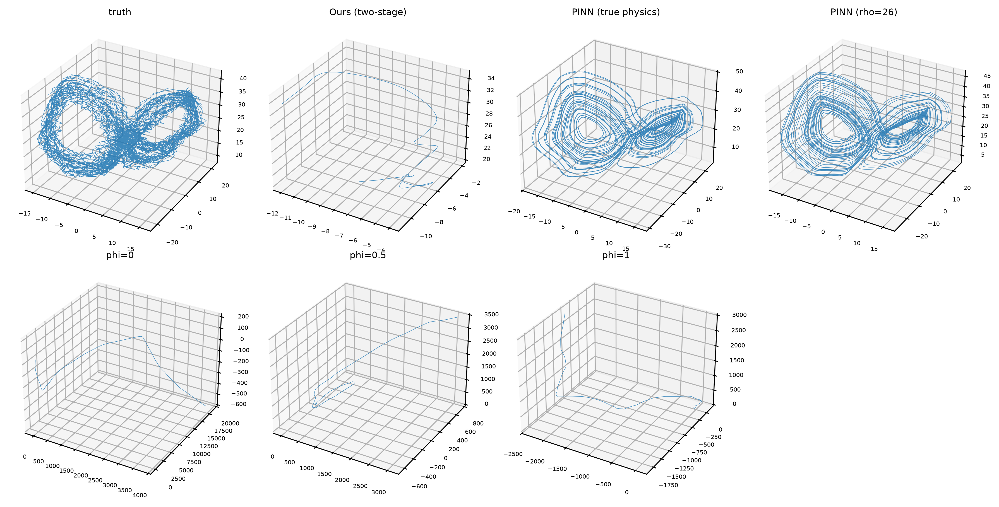

In [34]:
# The attractor itself, in probed state space.
Fig, Axes = PlotAttractor3D(
    [ApplyProbe(ProbeW, FutCNp[0])] + [ApplyProbe(ProbeW, ClimatePreds[n][0]) for n in Names],
    ["truth"] + Names, Cols=4, Width=3.0, Height=3.0)
plt.show()

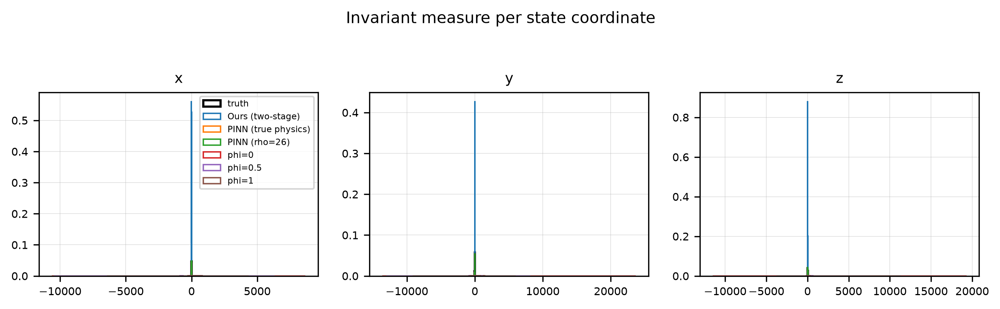

In [35]:
# Marginal distributions -- the invariant measure the Wasserstein column scores.
Fig, Axes = plt.subplots(1, 3, figsize=(9.0, 2.6), dpi=300)
TrueS = ApplyProbe(ProbeW, FutCNp.reshape(-1, N))
for i, Lab in enumerate(["x", "y", "z"]):
    Axes[i].hist(TrueS[:, i], bins=70, density=True, histtype="step",
                 linewidth=1.4, color="k", label="truth")
    for Name in Names:
        S = ApplyProbe(ProbeW, ClimatePreds[Name].reshape(-1, N))
        Axes[i].hist(S[:, i], bins=70, density=True, histtype="step",
                     linewidth=0.9, label=Name)
    Axes[i].set_title(Lab, fontsize=9); Axes[i].tick_params(labelsize=7)
    Axes[i].grid(True, linewidth=0.4, alpha=0.4); Axes[i].set_axisbelow(True)
Axes[0].legend(fontsize=5.5)
Fig.suptitle("Invariant measure per state coordinate", fontsize=10, y=1.04)
Fig.tight_layout()
plt.show()

## Speed under the matched budget

In [36]:
Timing = []
for Name, Model in [("Ours (two-stage)", OursModels[0]),
                    ("PINN (true physics)", PinnModels[0]),
                    (f"phi={PHIS[len(PHIS) // 2]:g}", JointModels[PHIS[len(PHIS) // 2]])]:
    T = TimeRollout(Model, Warm, HORIZON, repeats=3)
    Timing.append({"model": Name,
                   "trainable": CountParams(Model),
                   "inference params": CountInferenceParams(Model),
                   "FLOPs/fwd": CountFlops(Model),
                   f"rollout s ({Warm.shape[0]} x {HORIZON})": round(T["rollout_s"], 3),
                   "ms/step": round(T["ms_per_step"], 3)})
pd.DataFrame(Timing)

,model,trainable,inference params,FLOPs/fwd,rollout s (64 x 550),ms/step
0,Ours (two-stage),34371,116674,286848,0.368,0.668
1,PINN (true physics),145767,145767,289432,0.329,0.598
2,phi=0.5,145728,145728,288716,0.255,0.464


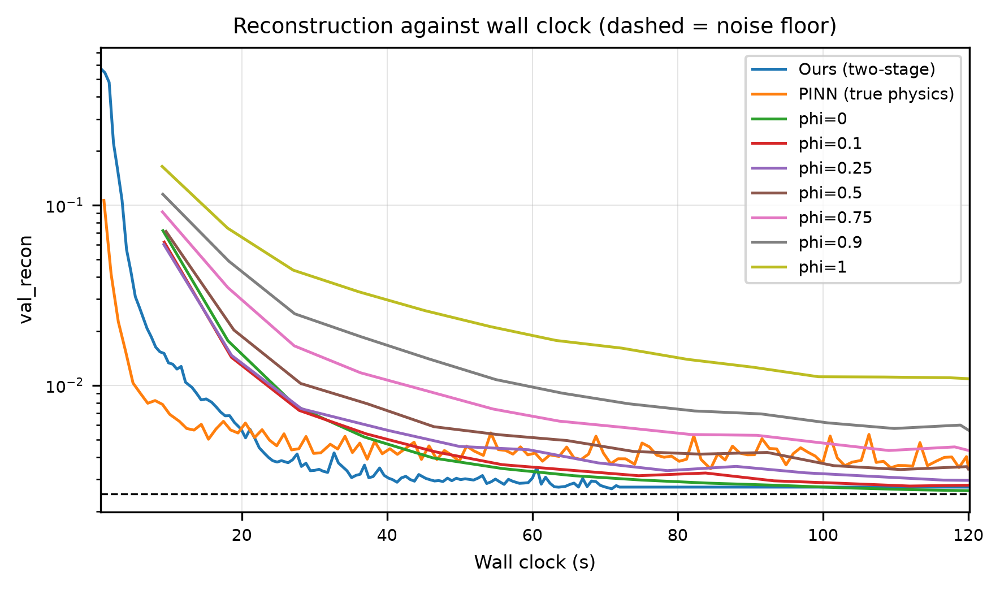

time to reach 2x the noise floor:
  Ours (two-stage)         22.4s
  PINN (true physics)      23.8s
  phi=0                    46.4s
  phi=0.1                  46.7s
  phi=0.25                 50.0s
  phi=0.5                  64.8s
  phi=0.75                 100.1s
  phi=0.9                  not reached
  phi=1                    not reached


In [37]:
Hists = {"Ours (two-stage)": OursHists[0], "PINN (true physics)": PinnHists[0]}
Hists.update({f"phi={p:g}": JointHists[p] for p in PHIS})
Fig, Ax = PlotTimeToQuality(Hists, Key="val_recon")
Ax.axhline(NOISE_FLOOR, color="k", linestyle="--", linewidth=0.8)
Ax.set_title("Reconstruction against wall clock (dashed = noise floor)", fontsize=9)
plt.show()

print("time to reach 2x the noise floor:")
for k, h in Hists.items():
    t = TimeToTarget(h, "val_recon", 2 * NOISE_FLOOR)
    print(f"  {k:24s} {('%.1fs' % t) if t else 'not reached'}")

# Headline: the tradeoff as a curve

The grey line is the phi sweep — the empirical Pareto front of the balancing approach. Every
other model is a point placed against it.

- A point **above and left** of the curve reconstructs *and* forecasts better than any setting of
  the knob achieves. That is dissolution.
- A point **on** the curve is another way of choosing the same tradeoff. That is balancing under
  a different name, and it means the tension is real.

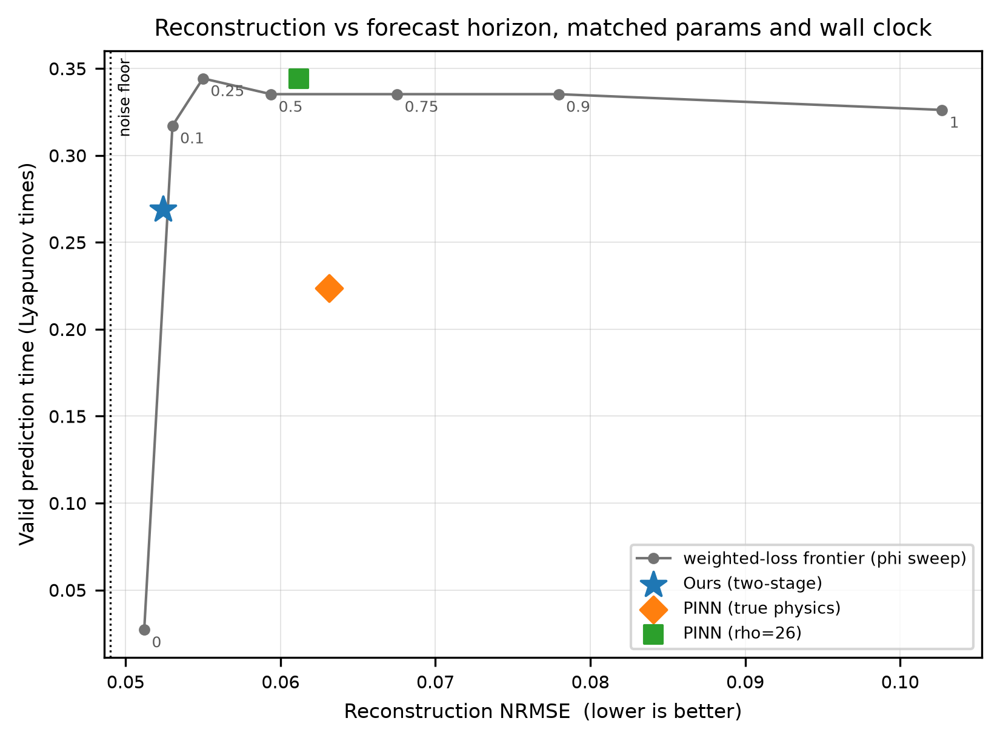

In [38]:
Frontier = [(f"{p:g}", Results[f"phi={p:g}"]) for p in PHIS]
Points = {k: Results[k] for k in ("Ours (two-stage)", "PINN (true physics)", "PINN (rho=26)")}

FloorNrmse = float(np.sqrt(NOISE_FLOOR) / SCALE)
Fig, Ax = PlotParetoFront(Frontier, Points, NoiseFloor=FloorNrmse)
Ax.set_title("Reconstruction vs forecast horizon, matched params and wall clock", fontsize=9)
plt.show()

## Ablations

Two questions the headline plot cannot answer on its own.

1. **Does advancing the bounded latent earn its parameters?** Roll out with the static `m(b)`
   instead of `m_dyn(b, C)`. If the static map does as well, `LatentMappingDynamic` is dead
   weight.
2. **Does the two-stage schedule matter?** Train the same architecture end-to-end, forecast
   objective included, so the forecast loss reshapes `b` and therefore reconstruction. If joint
   training lands on the phi curve while two-stage does not, the decoupling is doing the work
   rather than the architecture.

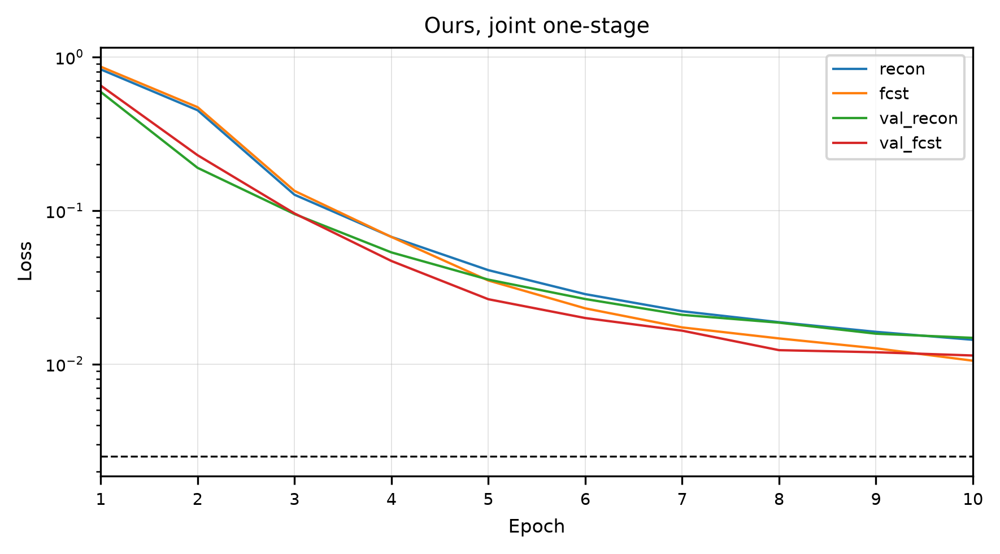

ours joint (seed 0) epoch 0010 |  106.5s | recon 1.437e-02 | fcst 1.050e-02 | val_recon 1.480e-02 | val_fcst 1.136e-02


ours joint:   0%|          | 0/55 [00:00<?, ?it/s]

ours joint (seed 0) epoch 0011 |  117.4s | recon 1.377e-02 | fcst 1.121e-02 | val_recon 1.353e-02 | val_fcst 9.219e-03


ours joint:   0%|          | 0/55 [00:00<?, ?it/s]

ours joint (seed 0) epoch 0012 |  120.1s | recon 1.241e-02 | fcst 1.002e-02 | val_recon 1.410e-02 | val_fcst 1.142e-02


In [39]:
def TrainOursJoint(Seed, Budget=BUDGET_S):
    """Same modules, one stage, forecast objective included from the start."""
    SeedAll(Seed)
    Model = DecoupledModel(N, K, A, B).to(DEVICE)
    Opt = torch.optim.Adam(Model.parameters(), lr=LR)

    def Epoch(Deadline):
        Perm = torch.randperm(XFull.shape[0])
        Sums, Nb = [0.0, 0.0], 0
        Batches = tqdm(range(0, len(Perm), SEQ_BATCH), desc="ours joint", leave=False)
        for i in Batches:
            if time.perf_counter() > Deadline:
                Batches.close()
                break
            Seq = XFull[Perm[i:i + SEQ_BATCH]]
            Flat = Seq.reshape(-1, N)
            XHat, Ct, CTeach, _, _ = Model(Flat)
            Rec = MseT(XHat, Flat) + W_CONSIST * MseT(Ct, CTeach)
            Fc = MseT(Model.Rollout(Seq[:, :WARM], UNROLL), Seq[:, WARM:])
            Loss = 0.5 * Rec + 0.5 * Fc
            Opt.zero_grad(); Loss.backward(); Opt.step()
            Sums = [Sums[0] + Rec.item(), Sums[1] + Fc.item()]
            Nb += 1
            Batches.set_postfix(recon=f"{Rec.item():.2e}", fcst=f"{Fc.item():.2e}")
        Nb = max(Nb, 1)
        return {"recon": Sums[0] / Nb, "fcst": Sums[1] / Nb}

    return Model, TimedTrain(Epoch, EvalFn=lambda: ValScores(Model), budget_s=Budget,
                             name=f"ours joint (seed {Seed})",
                             PlotFn=LossPlot(["recon", "fcst", "val_recon", "val_fcst"],
                                             Floor=NOISE_FLOOR, Title="Ours, joint one-stage"),
                             plot_every=max(PLOT_EVERY // 2, 1))


OursJointModel, OursJointHist = TrainOursJoint(SEEDS[0])

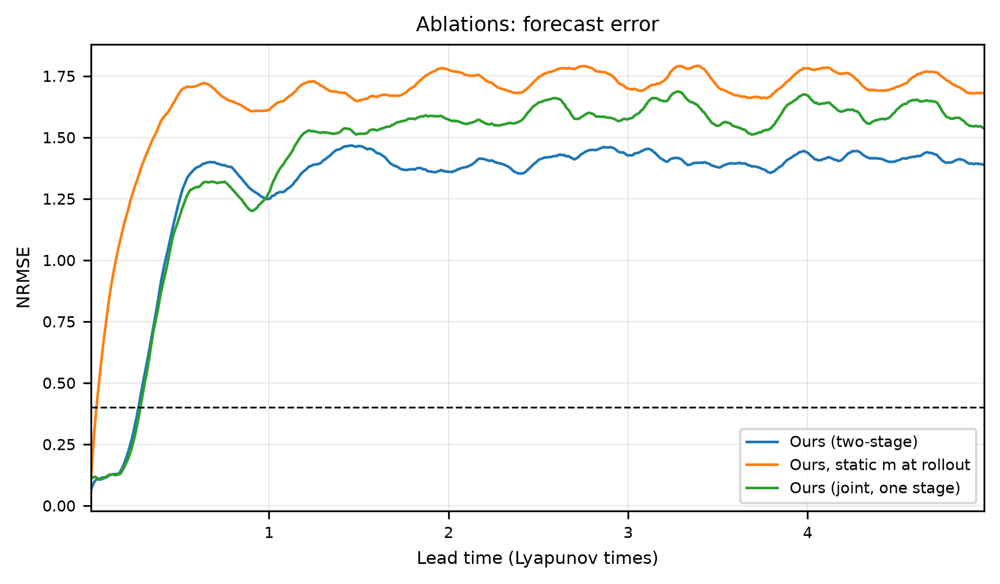

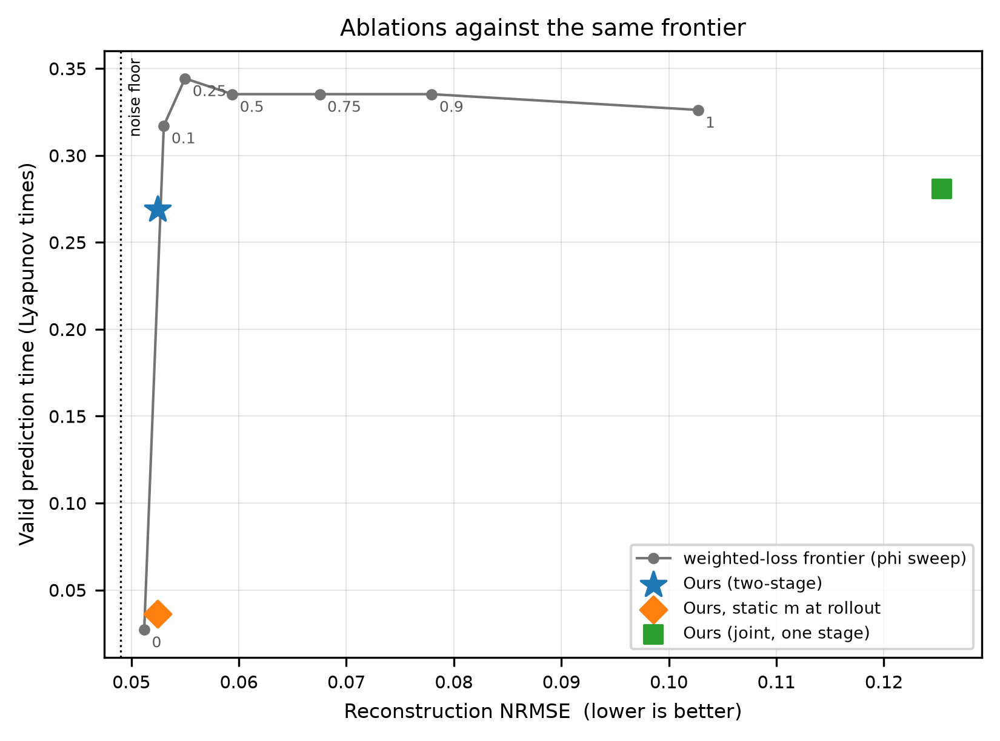

,model,recon MSE,recon NRMSE,VPT (Lyap),NRMSE @ H
0,Ours (two-stage),0.0029,0.0524,0.2688,1.3397
1,"Ours, static m at rollout",0.0029,0.0524,0.0362,1.6767
2,"Ours (joint, one stage)",0.0164,0.1254,0.2809,1.4800


In [40]:
Ablation = {"Ours (two-stage)": Results["Ours (two-stage)"],
            "Ours, static m at rollout": Agg(OursModels, "Ours, static m at rollout",
                                             dynamic=False),
            "Ours (joint, one stage)": Agg([OursJointModel], "Ours (joint, one stage)")}

Fig, Ax = PlotHorizonCurves({k: v["curve"] for k, v in Ablation.items()},
                            Dt=DT, Lam=LAMBDA_MAX, Threshold=THRESHOLD)
Ax.set_title("Ablations: forecast error", fontsize=9)
plt.show()

Fig, Ax = PlotParetoFront(Frontier, Ablation, NoiseFloor=FloorNrmse)
Ax.set_title("Ablations against the same frontier", fontsize=9)
plt.show()

pd.DataFrame([{"model": r["model"], "recon MSE": r["recon_mse"],
               "recon NRMSE": r["recon_nrmse"], "VPT (Lyap)": r["vpt"],
               "NRMSE @ H": r["fcst_nrmse_full"]}
              for r in Ablation.values()]).round(4)

# Summary

In [41]:
Summary = pd.DataFrame([{
    "model": r["model"],
    "recon MSE": r.get("recon_mse"),
    "recon NRMSE": r.get("recon_nrmse"),
    "VPT (Lyap)": r.get("vpt"),
    "VPT std": r.get("vpt_std", 0.0),
    "NRMSE @ 5LT": r.get("fcst_nrmse_full"),
    "divergence": r.get("divergence"),
} for r in Results.values()]).round(4)

print(f"Every row: {TARGET:,} trainable params, {BUDGET_S:.0f}s wall clock, "
      f"{THREADS} CPU thread, {len(SEEDS)} seed(s) where marked.")
Summary.sort_values("VPT (Lyap)", ascending=False).reset_index(drop=True)

Every row: 145,410 trainable params, 120s wall clock, 1 CPU thread, 3 seed(s) where marked.


,model,recon MSE,recon NRMSE,VPT (Lyap),VPT std,NRMSE @ 5LT,divergence
0,PINN (rho=26),0.0039,0.0612,0.3443,0.0000,1.2565,0.7812
1,phi=0.25,0.0031,0.0550,0.3443,0.0000,13.8068,1.0000
2,phi=0.5,0.0037,0.0594,0.3352,0.0000,10.6726,1.0000
3,phi=0.75,0.0047,0.0675,0.3352,0.0000,9.5044,1.0000
4,phi=0.9,0.0063,0.0779,0.3352,0.0000,12.4134,1.0000
5,phi=1,0.0110,0.1027,0.3262,0.0000,13.0464,1.0000
6,phi=0.1,0.0029,0.0530,0.3171,0.0000,15.4178,1.0000
7,Ours (two-stage),0.0029,0.0524,0.2688,0.0043,1.3397,0.0729
8,PINN (true physics),0.0042,0.0631,0.2235,0.1517,3.0139,0.7292
9,persistence,NaN,NaN,0.0362,0.0000,1.3505,0.0000


## Reading this

The result is whatever the Pareto plot shows, and both outcomes are publishable:

- **Ours above the frontier** — the tradeoff observed across the reconstruction+prediction
  literature is an artifact of forcing one latent to serve both objectives, and separating the
  carriers escapes it on Lorenz. The next step is the cross-domain claim: turbofan, weather,
  bearing.
- **Ours on the frontier** — the tension is structural, at least at this capacity, and the
  interesting question becomes *why*: whether it is the rate-distortion frontier itself, or a
  bound specific to fixed-capacity bounded latents that adaptive precision could still escape.

What this notebook does **not** establish.

- **One system, one lift, one noise level.** The phenomenon claim needs turbofan, weather and
  bearing before it is a claim about representations rather than about Lorenz.
- **No published latent-forecast baseline.** The weighted-loss AE+GRU is the balancing approach
  in its plainest form, not a named method, so a reader can fairly call it a construction. A
  Consistent Koopman Autoencoder (Azencot et al., ICML 2020) is the cheapest fix: encoder/decoder
  plus a linear operator with forward/backward consistency, ~100 lines, and it reports both
  metrics natively. Worth noting that Koopa (NeurIPS 2023) explicitly *drops* the reconstruction
  loss to get its forecasting numbers — a SOTA paper conceding the tradeoff in its own abstract.
- **The PINN is an oracle**, handed the exact governing equations. The rho=26 row is the only
  honest read on what physics buys when it is merely approximately right.
- **`STAGE_A_FRAC` is untuned.** Ours is the one model that splits its budget between two stages,
  and 0.6 was picked, not searched. A reader is entitled to ask what the frontier looks like as
  that split moves, and sweeping it is the obvious next check.